In [ ]:
#Basic Libraries
import pandas as pd
import numpy as np
import datetime as dt
from datetime import datetime
from pandas import Series
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler

#Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
sns.set_style("whitegrid")
%matplotlib inline
import altair as alt
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10

In [ ]:
df=pd.read_csv('/content/datafile.csv')

In [ ]:
df.head()

,ServiceName,RpoName,SchemeType,LastWeekCount,LastMonthCount,YearTillDate,Date
0,Applications Received - Scheme wise,RPO Ahmedabad,Normal,7174,51414,567081,2019-11-03 04:29:09.831353
1,Applications Received - Scheme wise,RPO Ahmedabad,Tatkaal,160,1368,14930,2019-11-03 04:29:09.831353
2,Applications Received - Gender wise,RPO Ahmedabad,FEMALE,3029,21273,233635,2019-11-03 04:29:09.831353
3,Applications Received - Gender wise,RPO Ahmedabad,MALE,4305,31498,348282,2019-11-03 04:29:09.831353
4,Applications Received - Gender wise,RPO Ahmedabad,TRANSGENDER,0,1,15,2019-11-03 04:29:09.831353


In [ ]:
df.isnull().sum()

ServiceName       0
RpoName           0
SchemeType        0
LastWeekCount     0
LastMonthCount    0
YearTillDate      0
Date              0
dtype: int64

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
print(df.describe())

       LastWeekCount  LastMonthCount  YearTillDate  \
count   9.250000e+02    9.250000e+02  9.250000e+02   
mean    2.535146e+05    1.123857e+06  1.194246e+07   
min     0.000000e+00    0.000000e+00  0.000000e+00   
25%     1.560000e+02    6.780000e+02  7.176000e+03   
50%     1.031000e+03    4.366000e+03  4.314600e+04   
75%     3.936000e+03    1.709200e+04  1.762640e+05   
max     1.229100e+07    5.827875e+07  6.510913e+08   
std     1.157870e+06    5.101418e+06  5.466862e+07   

                                Date  
count                            925  
mean   2019-09-07 19:22:55.183073280  
min       2016-12-25 04:03:38.838183  
25%    2019-11-03 04:29:09.831353088  
50%    2019-11-03 04:29:09.831353088  
75%    2019-11-03 04:29:09.831353088  
max       2019-11-03 04:29:09.831353  
std                              NaN  


In [ ]:
df.replace(0, np.nan, inplace=True)

In [ ]:
df.isnull().sum()

ServiceName         0
RpoName             0
SchemeType          0
LastWeekCount     148
LastMonthCount    138
YearTillDate      117
Date                0
dtype: int64

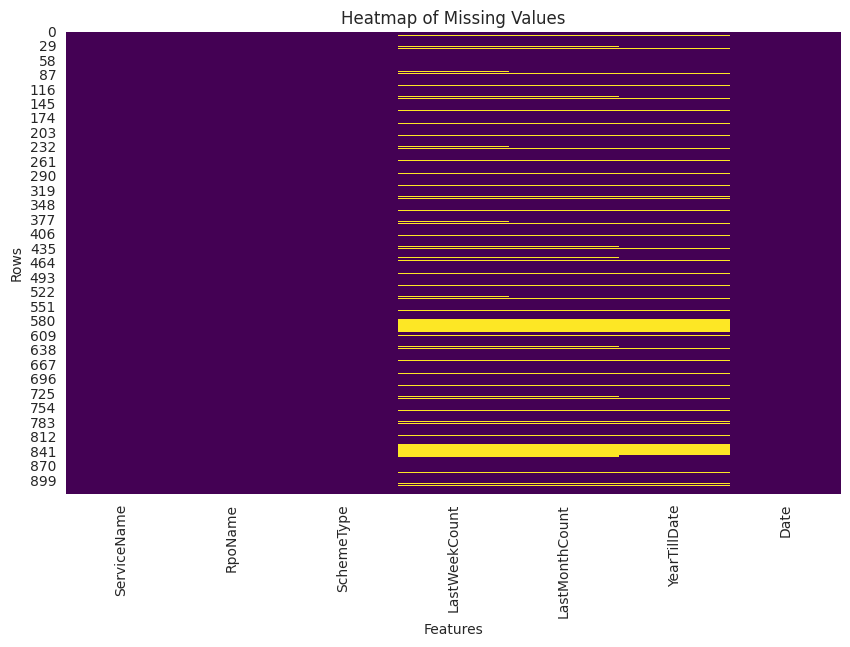

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False)
plt.title('Heatmap of Missing Values')
plt.xlabel('Features')
plt.ylabel('Rows')
plt.show()

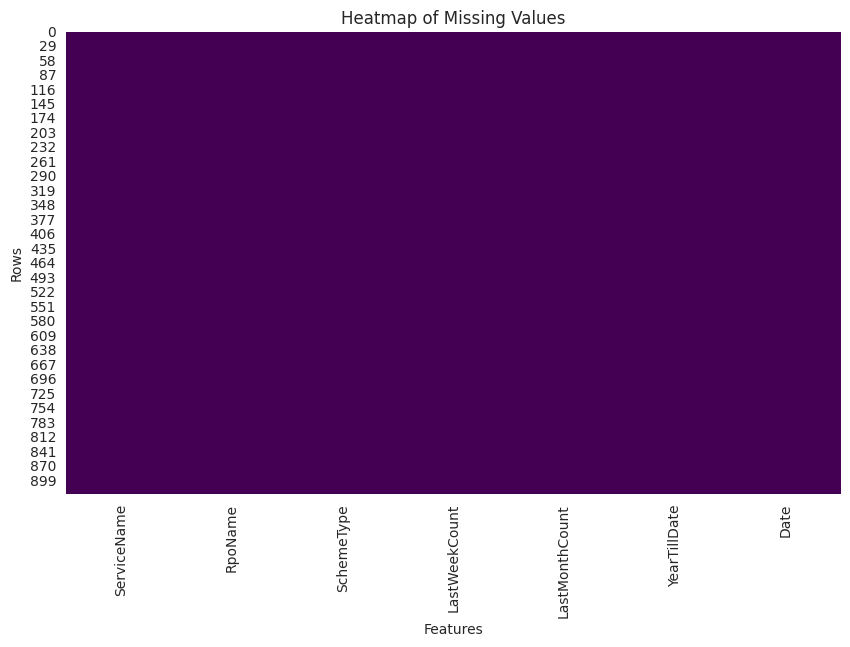

In [ ]:
df['LastWeekCount'].fillna(df['LastWeekCount'].mean(), inplace=True)
df['LastMonthCount'].fillna(df['LastMonthCount'].mean(), inplace=True)
df['YearTillDate'].fillna(df['YearTillDate'].mean(), inplace=True)
df.isnull().sum()
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cmap='viridis', cbar=False)
plt.title('Heatmap of Missing Values')
plt.xlabel('Features')
plt.ylabel('Rows')
plt.show()

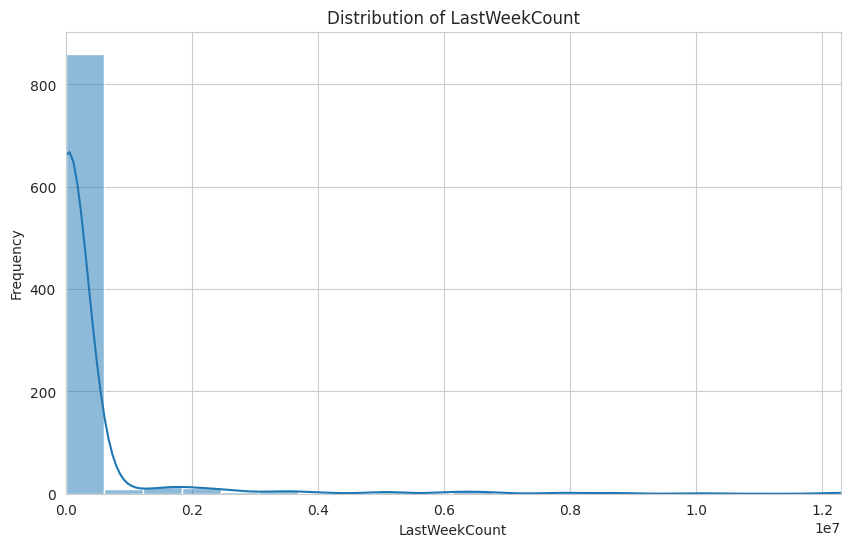

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(df['LastWeekCount'], bins=20, kde=True)
plt.title('Distribution of LastWeekCount')
plt.xlabel('LastWeekCount')
plt.ylabel('Frequency')

# Set the x-axis range to extend beyond the data's minimum and maximum values
plt.xlim(df['LastWeekCount'].min() - 10, df['LastWeekCount'].max() + 10)

plt.show()


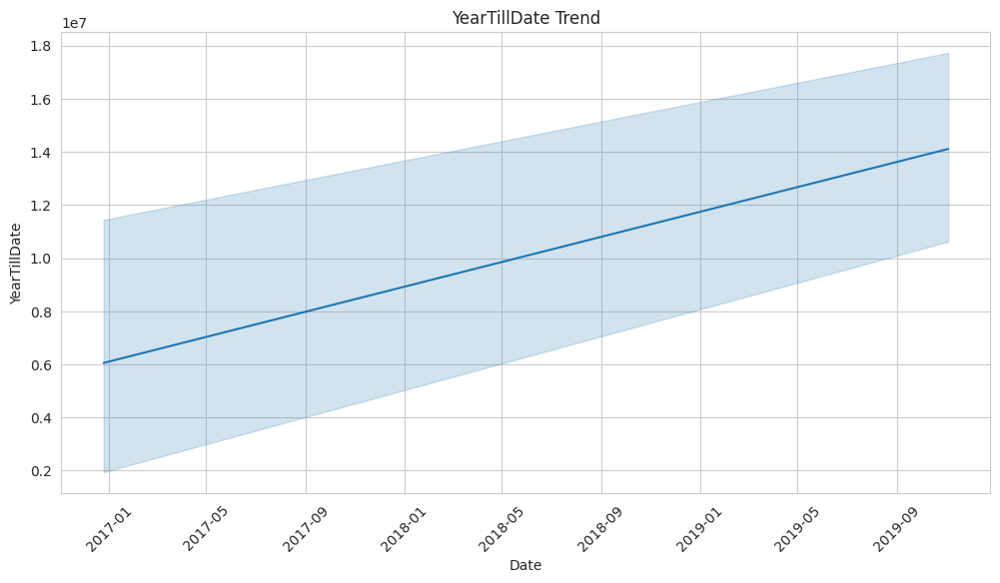

In [ ]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='YearTillDate', data=df)
plt.title('YearTillDate Trend')
plt.xlabel('Date')
plt.ylabel('YearTillDate')
plt.xticks(rotation=45)
plt.show()

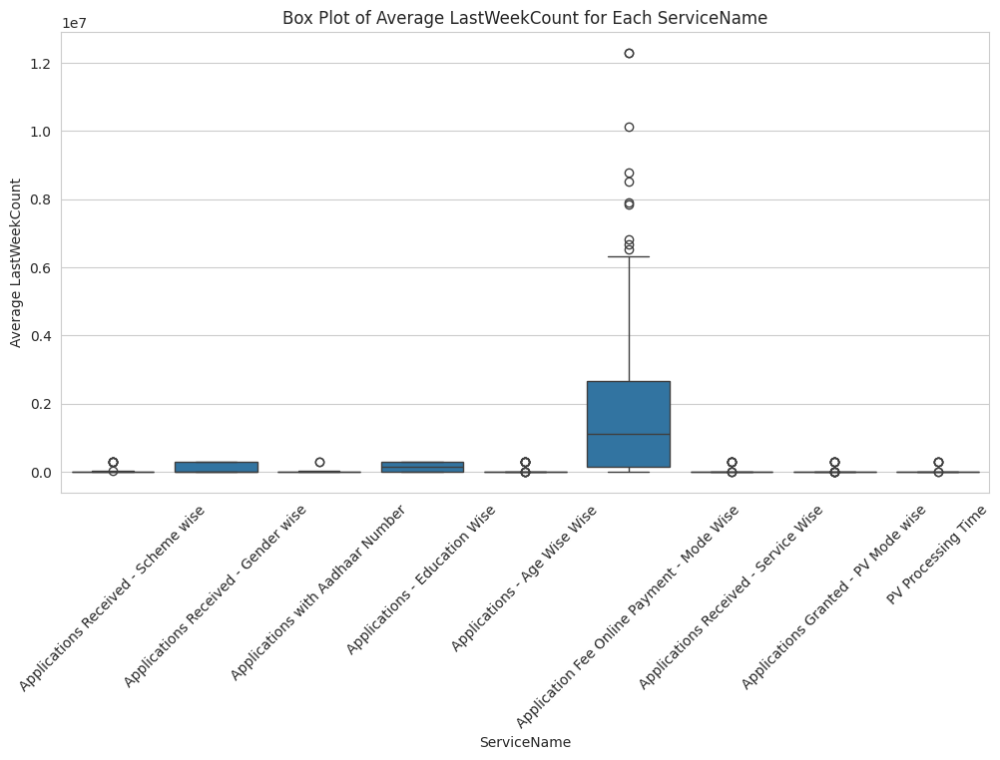

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='ServiceName', y='LastWeekCount', data=df)
plt.title('Box Plot of Average LastWeekCount for Each ServiceName')
plt.xlabel('ServiceName')
plt.ylabel('Average LastWeekCount')
plt.xticks(rotation=45)
plt.show()

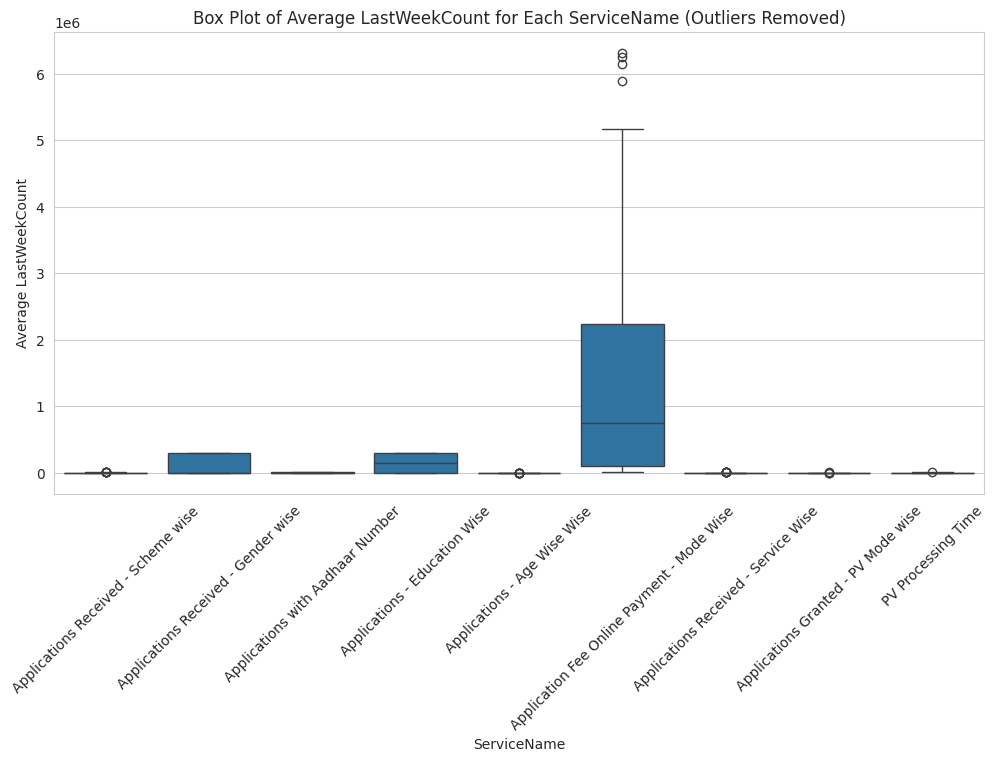

In [ ]:
def remove_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    return data[~((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR)))]

# Remove outliers from LastWeekCount column for each ServiceName
df['LastWeekCount'] = df.groupby('ServiceName')['LastWeekCount'].transform(remove_outliers)

# Create a box plot for Average LastWeekCount for each ServiceName after removing outliers
plt.figure(figsize=(12, 6))
sns.boxplot(x='ServiceName', y='LastWeekCount', data=df)
plt.title('Box Plot of Average LastWeekCount for Each ServiceName (Outliers Removed)')
plt.xlabel('ServiceName')
plt.ylabel('Average LastWeekCount')
plt.xticks(rotation=45)
plt.show()

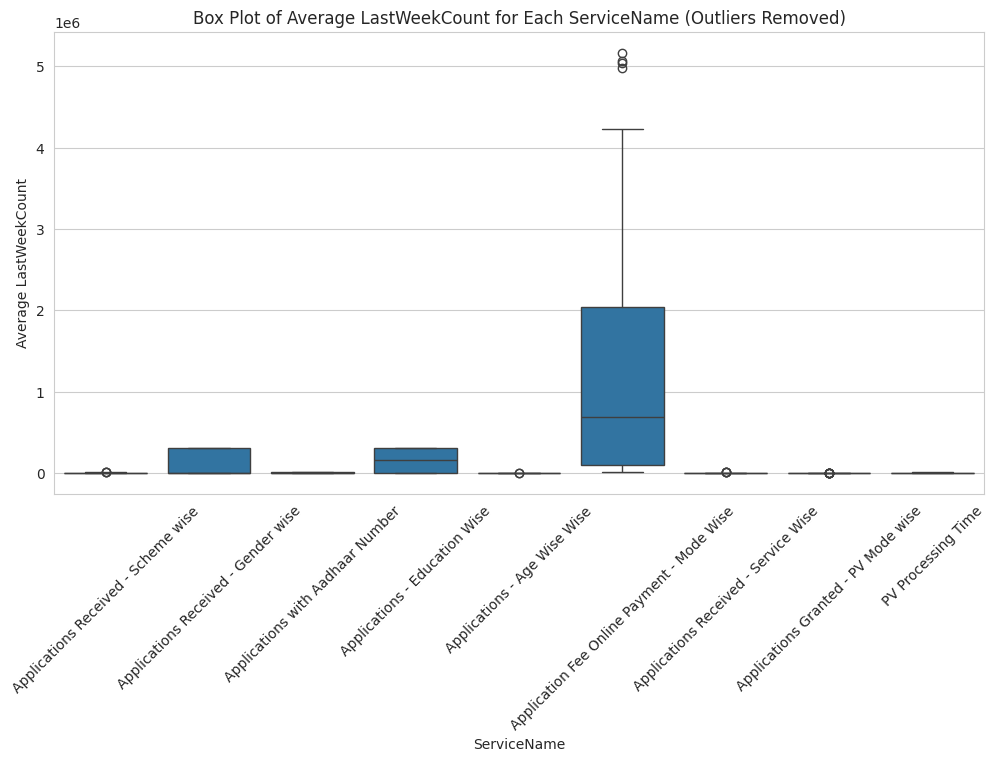

In [ ]:
def remove_outliers(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    return data[~((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR)))]

# Remove outliers from LastWeekCount column for each ServiceName except 'Applications-age wise'
df_filtered = df[df['ServiceName'] != 'Applications - Age wise'].copy()
df_filtered['LastWeekCount'] = df_filtered.groupby('ServiceName')['LastWeekCount'].transform(remove_outliers)

# Filter data for 'Applications-age wise' ServiceName
df_applications_age_wise = df[df['ServiceName'] == 'Applications - age wise'].copy()
df_applications_age_wise['LastWeekCount'] = remove_outliers(df_applications_age_wise['LastWeekCount'])

# Concatenate filtered dataframes
df_final = pd.concat([df_filtered, df_applications_age_wise])

# Create a box plot for Average LastWeekCount for each ServiceName after removing outliers
plt.figure(figsize=(12, 6))
sns.boxplot(x='ServiceName', y='LastWeekCount', data=df_final)
plt.title('Box Plot of Average LastWeekCount for Each ServiceName (Outliers Removed)')
plt.xlabel('ServiceName')
plt.ylabel('Average LastWeekCount')
plt.xticks(rotation=45)
plt.show()

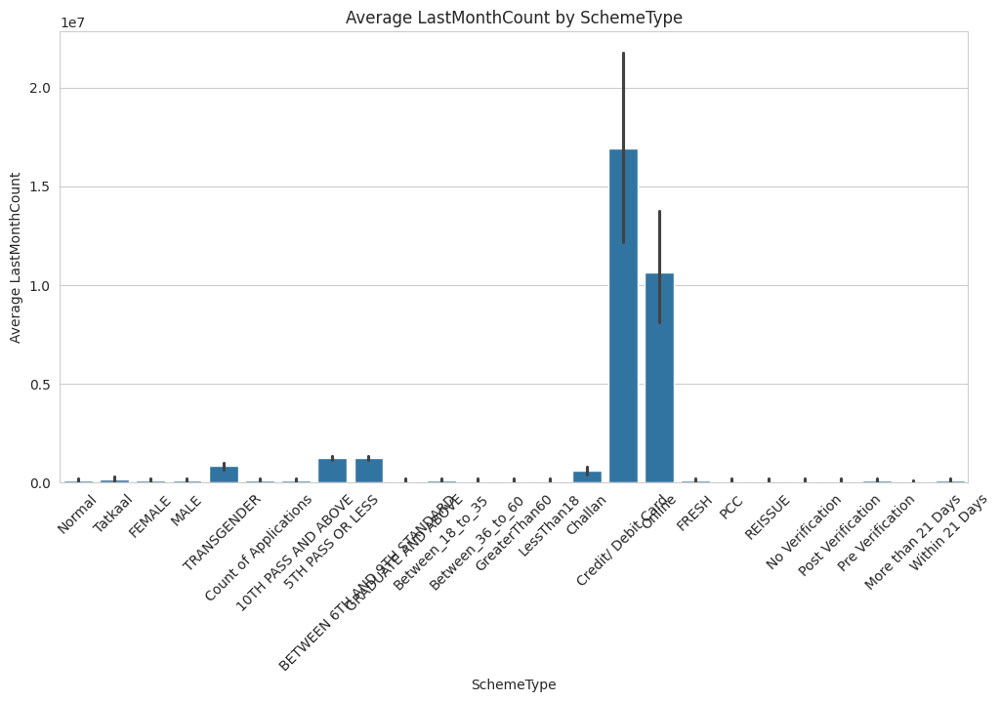

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(x='SchemeType', y='LastMonthCount', data=df)
plt.title('Average LastMonthCount by SchemeType')
plt.xlabel('SchemeType')
plt.ylabel('Average LastMonthCount')
plt.xticks(rotation=45)
plt.show()

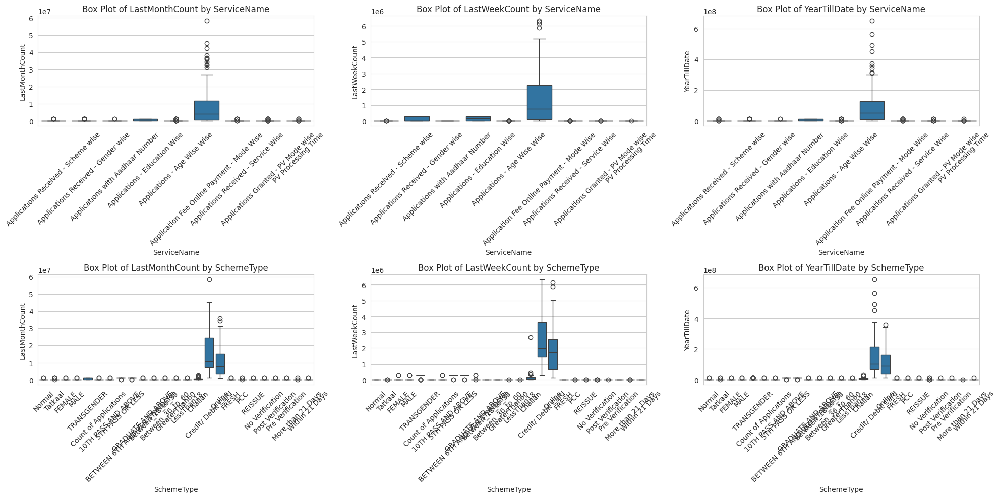

In [ ]:
plt.subplot(2, 3, 1)
sns.boxplot(x='ServiceName', y='LastMonthCount', data=df)
plt.title('Box Plot of LastMonthCount by ServiceName')
plt.xlabel('ServiceName')
plt.ylabel('LastMonthCount')
plt.xticks(rotation=45)

# Box plots for LastWeekCount by ServiceName
plt.subplot(2, 3, 2)
sns.boxplot(x='ServiceName', y='LastWeekCount', data=df)
plt.title('Box Plot of LastWeekCount by ServiceName')
plt.xlabel('ServiceName')
plt.ylabel('LastWeekCount')
plt.xticks(rotation=45)

# Box plots for YearTillDate by ServiceName
plt.subplot(2, 3, 3)
sns.boxplot(x='ServiceName', y='YearTillDate', data=df)
plt.title('Box Plot of YearTillDate by ServiceName')
plt.xlabel('ServiceName')
plt.ylabel('YearTillDate')
plt.xticks(rotation=45)

# Box plots for LastMonthCount by SchemeType
plt.subplot(2, 3, 4)
sns.boxplot(x='SchemeType', y='LastMonthCount', data=df)
plt.title('Box Plot of LastMonthCount by SchemeType')
plt.xlabel('SchemeType')
plt.ylabel('LastMonthCount')
plt.xticks(rotation=45)

# Box plots for LastWeekCount by SchemeType
plt.subplot(2, 3, 5)
sns.boxplot(x='SchemeType', y='LastWeekCount', data=df)
plt.title('Box Plot of LastWeekCount by SchemeType')
plt.xlabel('SchemeType')
plt.ylabel('LastWeekCount')
plt.xticks(rotation=45)

# Box plots for YearTillDate by SchemeType
plt.subplot(2, 3, 6)
sns.boxplot(x='SchemeType', y='YearTillDate', data=df)
plt.title('Box Plot of YearTillDate by SchemeType')
plt.xlabel('SchemeType')
plt.ylabel('YearTillDate')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

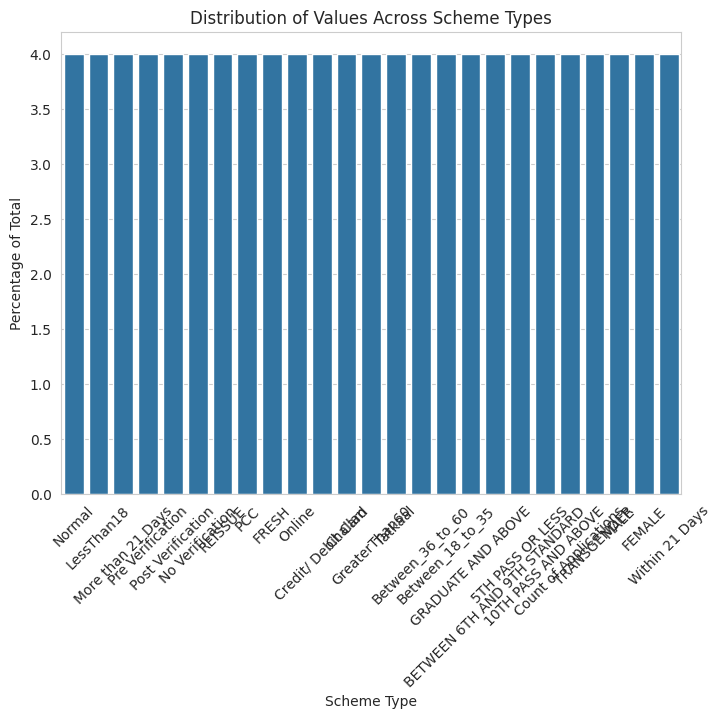

In [ ]:
scheme_type_counts = df['SchemeType'].value_counts()

# Normalize the counts to percentages
scheme_type_percentages = scheme_type_counts / scheme_type_counts.sum() * 100

# Bar plot for normalized scheme type percentages
plt.figure(figsize=(8, 6))
sns.barplot(x=scheme_type_percentages.index, y=scheme_type_percentages.values)
plt.title('Distribution of Values Across Scheme Types')
plt.xlabel('Scheme Type')
plt.ylabel('Percentage of Total')
plt.xticks(rotation=45)
plt.show()

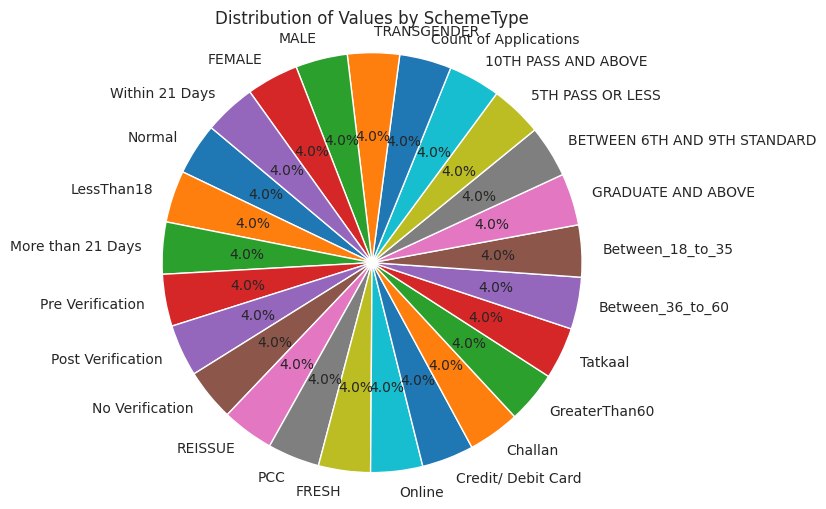

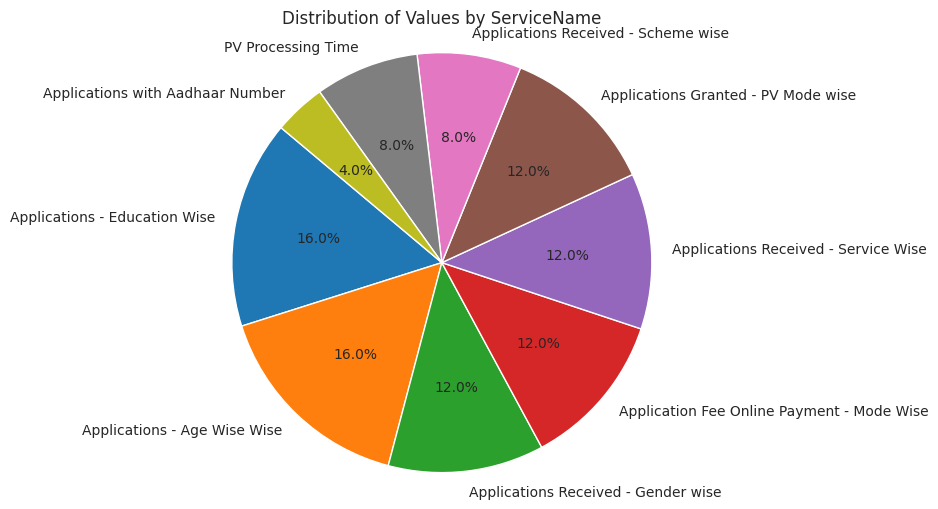

In [ ]:
scheme_type_counts = df['SchemeType'].value_counts()

# Plot SchemeType-wise pie chart
plt.figure(figsize=(8, 6))
plt.pie(scheme_type_counts, labels=scheme_type_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Values by SchemeType')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

# Calculate the distribution of values for each ServiceName
service_name_counts = df['ServiceName'].value_counts()

# Plot ServiceName-wise pie chart
plt.figure(figsize=(8, 6))
plt.pie(service_name_counts, labels=service_name_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Values by ServiceName')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

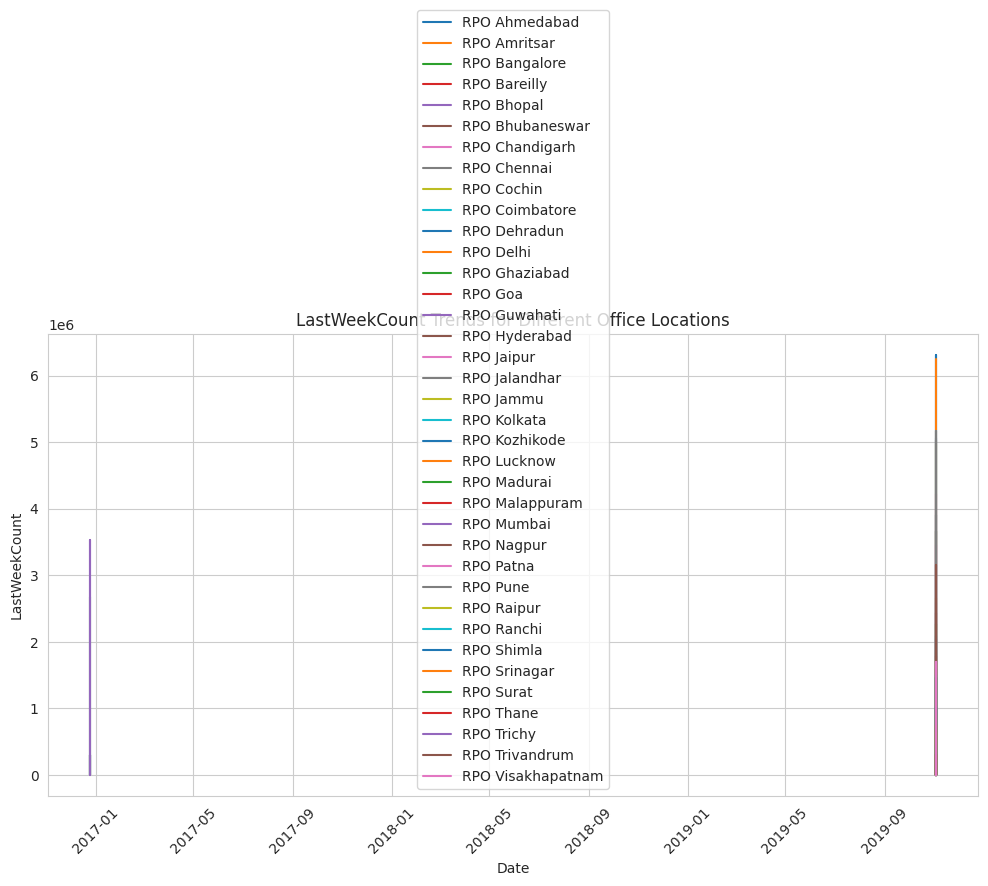

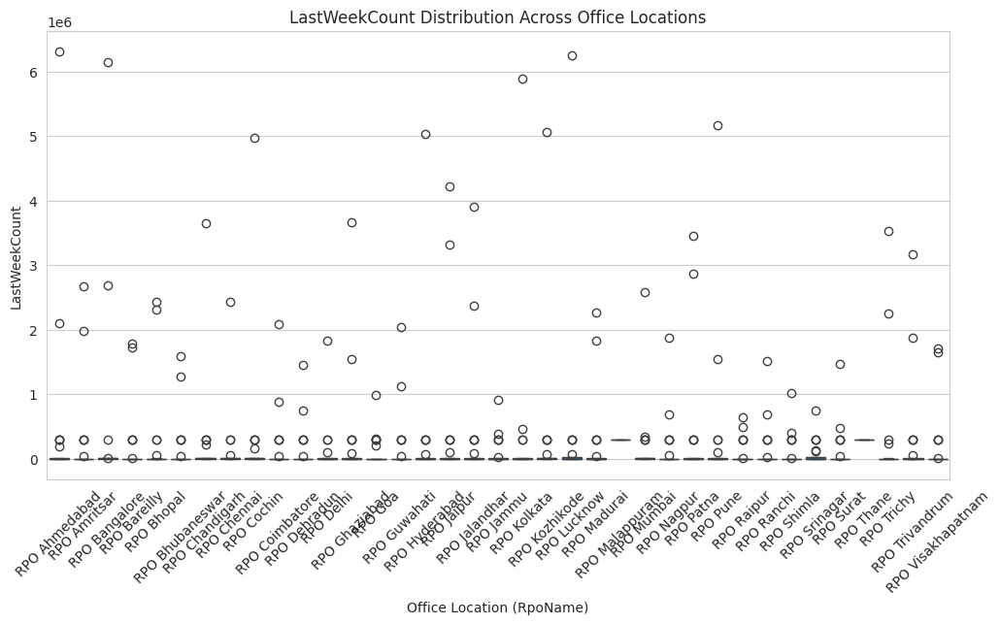

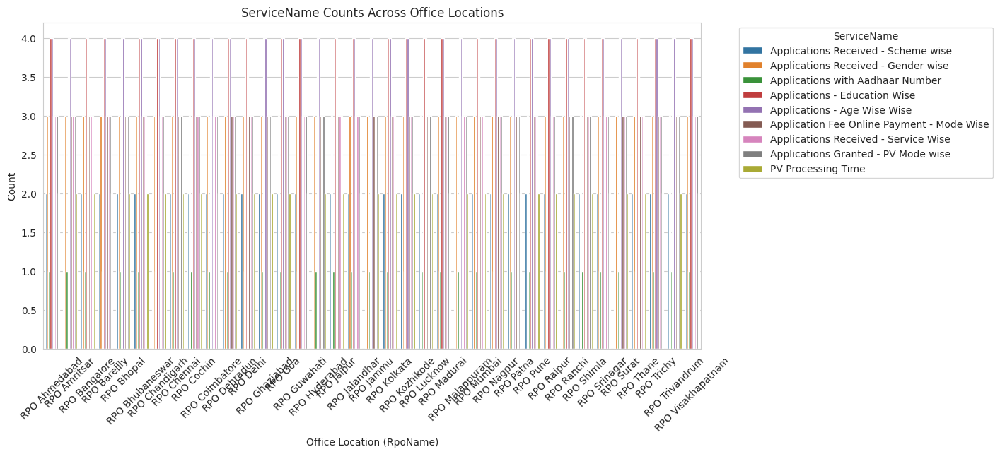

In [ ]:
office_locations = df['RpoName'].unique()

plt.figure(figsize=(12, 6))
for location in office_locations:
    df_location = df[df['RpoName'] == location]
    plt.plot(df_location['Date'], df_location['LastWeekCount'], label=location)
plt.title('LastWeekCount Trends for Different Office Locations')
plt.xlabel('Date')
plt.ylabel('LastWeekCount')
plt.legend()
plt.xticks(rotation=45)
plt.show()

# Box plots comparing distributions of LastWeekCount across office locations
plt.figure(figsize=(12, 6))
sns.boxplot(x='RpoName', y='LastWeekCount', data=df)
plt.title('LastWeekCount Distribution Across Office Locations')
plt.xlabel('Office Location (RpoName)')
plt.ylabel('LastWeekCount')
plt.xticks(rotation=45)
plt.show()

# Bar plots showing counts of ServiceName for each office location
plt.figure(figsize=(12, 6))
sns.countplot(x='RpoName', hue='ServiceName', data=df)
plt.title('ServiceName Counts Across Office Locations')
plt.xlabel('Office Location (RpoName)')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='ServiceName', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

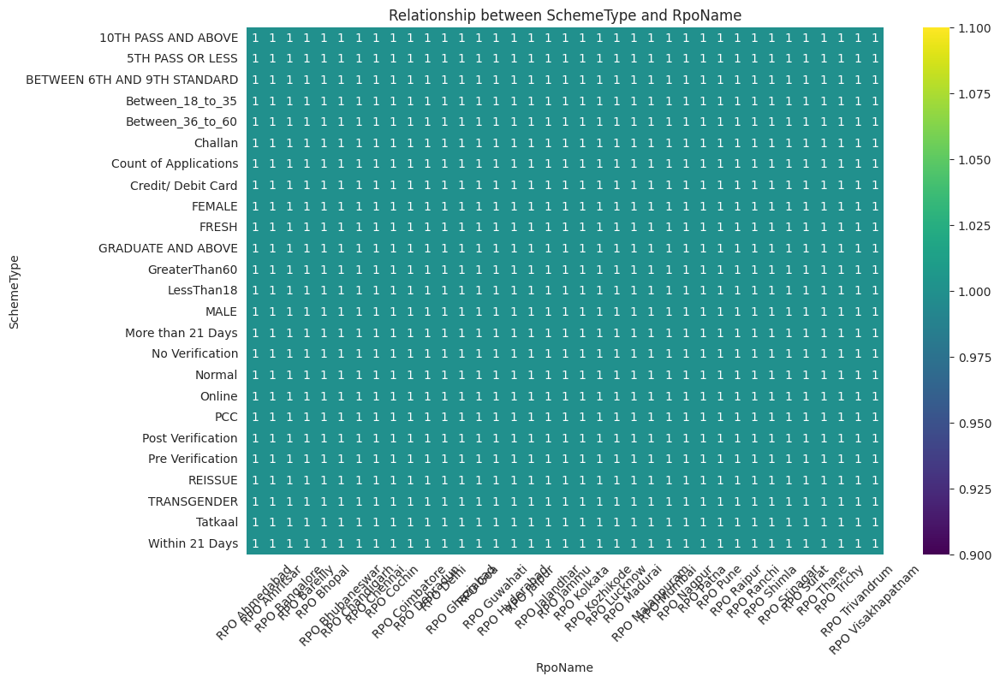

In [ ]:
cross_tab = pd.crosstab(df['SchemeType'], df['RpoName'])

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(cross_tab, cmap='viridis', annot=True, fmt='d')
plt.title('Relationship between SchemeType and RpoName')
plt.xlabel('RpoName')
plt.ylabel('SchemeType')
plt.xticks(rotation=45)
plt.show()

<Figure size 1200x800 with 0 Axes>

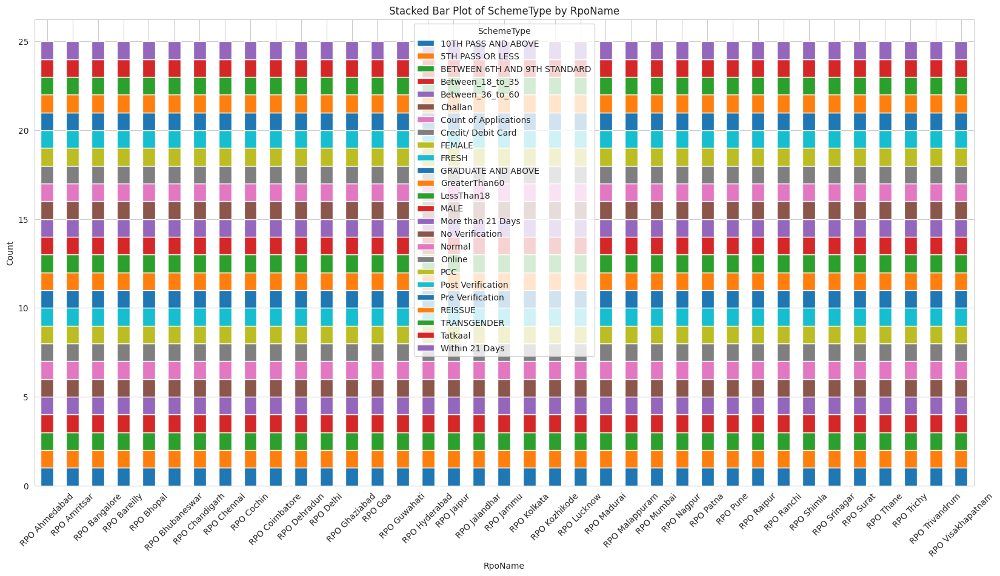

In [ ]:
grouped_df = df.groupby(['RpoName', 'SchemeType']).size().unstack(fill_value=0)

# Plot stacked bar plot
plt.figure(figsize=(12, 8))
grouped_df.plot(kind='bar', stacked=True)
plt.title('Stacked Bar Plot of SchemeType by RpoName')
plt.xlabel('RpoName')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='SchemeType')
plt.show()

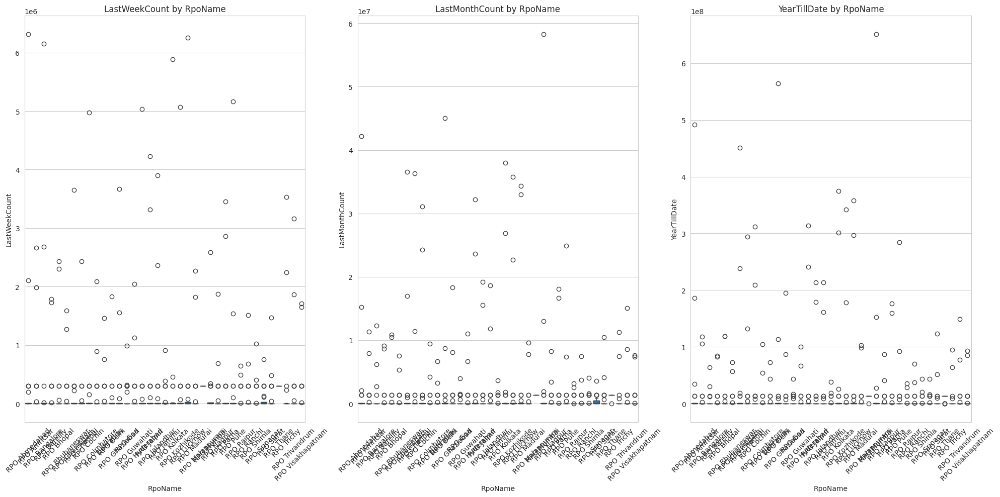

In [ ]:
plt.subplot(1, 3, 1)
sns.boxplot(x='RpoName', y='LastWeekCount', data=df)
plt.title('LastWeekCount by RpoName')
plt.xlabel('RpoName')
plt.ylabel('LastWeekCount')
plt.xticks(rotation=45)

# Box plot for LastMonthCount by RpoName
plt.subplot(1, 3, 2)
sns.boxplot(x='RpoName', y='LastMonthCount', data=df)
plt.title('LastMonthCount by RpoName')
plt.xlabel('RpoName')
plt.ylabel('LastMonthCount')
plt.xticks(rotation=45)

# Box plot for YearTillDate by RpoName
plt.subplot(1, 3, 3)
sns.boxplot(x='RpoName', y='YearTillDate', data=df)
plt.title('YearTillDate by RpoName')
plt.xlabel('RpoName')
plt.ylabel('YearTillDate')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 80.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 84.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 81.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 87.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 83.3% of the points cannot be plac

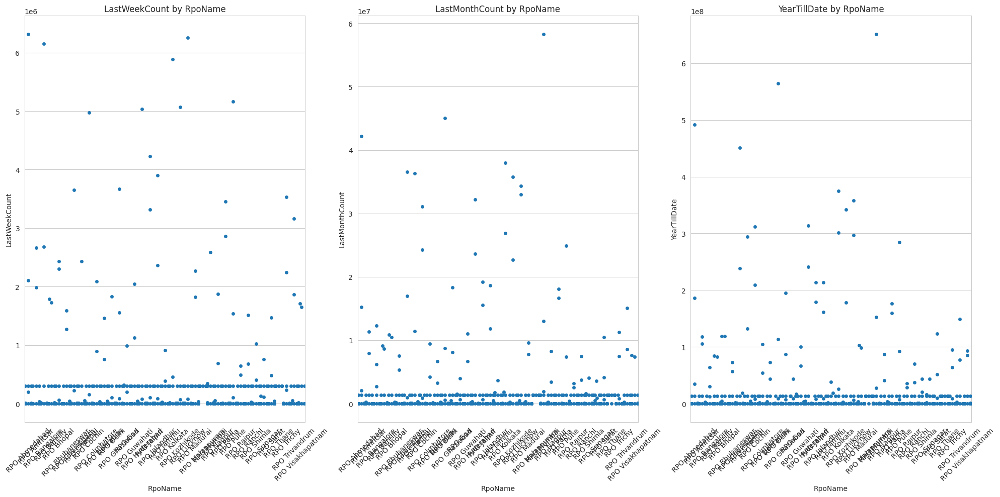

In [ ]:
plt.subplot(1, 3, 1)
sns.swarmplot(x='RpoName', y='LastWeekCount', data=df)
plt.title('LastWeekCount by RpoName')
plt.xlabel('RpoName')
plt.ylabel('LastWeekCount')
plt.xticks(rotation=45)

# Swarm plot for LastMonthCount by RpoName
plt.subplot(1, 3, 2)
sns.swarmplot(x='RpoName', y='LastMonthCount', data=df)
plt.title('LastMonthCount by RpoName')
plt.xlabel('RpoName')
plt.ylabel('LastMonthCount')
plt.xticks(rotation=45)

# Swarm plot for YearTillDate by RpoName
plt.subplot(1, 3, 3)
sns.swarmplot(x='RpoName', y='YearTillDate', data=df)
plt.title('YearTillDate by RpoName')
plt.xlabel('RpoName')
plt.ylabel('YearTillDate')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

<ipython-input-25-86b532923095>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointplot(x='RpoName', y='LastWeekCount', data=df, ci='sd')
<ipython-input-25-86b532923095>:10: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointplot(x='RpoName', y='LastMonthCount', data=df, ci='sd')
<ipython-input-25-86b532923095>:18: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.pointplot(x='RpoName', y='YearTillDate', data=df, ci='sd')


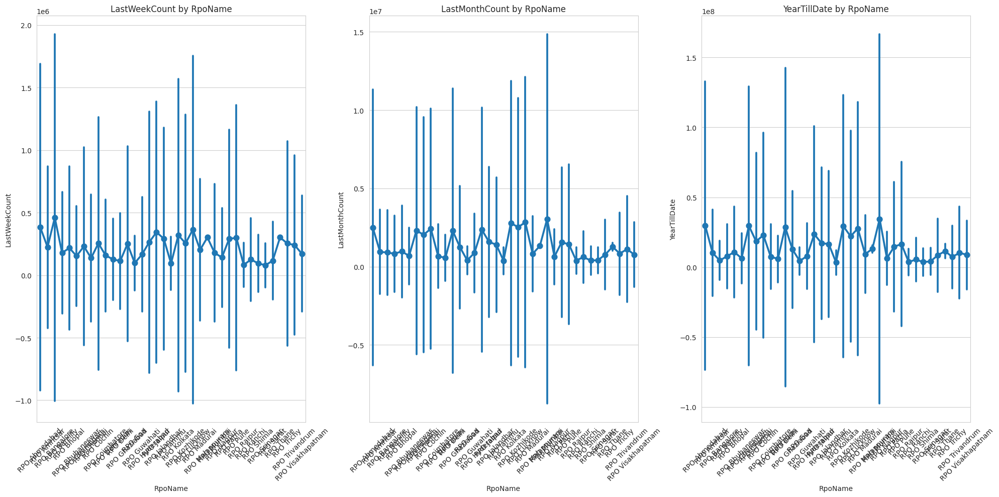

In [ ]:
plt.subplot(1, 3, 1)
sns.pointplot(x='RpoName', y='LastWeekCount', data=df, ci='sd')
plt.title('LastWeekCount by RpoName')
plt.xlabel('RpoName')
plt.ylabel('LastWeekCount')
plt.xticks(rotation=45)

# Point plot for LastMonthCount by RpoName
plt.subplot(1, 3, 2)
sns.pointplot(x='RpoName', y='LastMonthCount', data=df, ci='sd')
plt.title('LastMonthCount by RpoName')
plt.xlabel('RpoName')
plt.ylabel('LastMonthCount')
plt.xticks(rotation=45)

# Point plot for YearTillDate by RpoName
plt.subplot(1, 3, 3)
sns.pointplot(x='RpoName', y='YearTillDate', data=df, ci='sd')
plt.title('YearTillDate by RpoName')
plt.xlabel('RpoName')
plt.ylabel('YearTillDate')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
numerical_features = ['LastWeekCount', 'LastMonthCount', 'YearTillDate']

# Perform standardization
scaler = StandardScaler()
df_standardized = df.copy()
df_standardized[numerical_features] = scaler.fit_transform(df[numerical_features])

# Save the standardized dataset to a new CSV file
df_standardized.to_csv('standardized_passport_service_data.csv', index=False)

In [ ]:
df_standardized.head()


,ServiceName,RpoName,SchemeType,LastWeekCount,LastMonthCount,YearTillDate,Date
0,Applications Received - Scheme wise,RPO Ahmedabad,Normal,-0.278055,-0.250056,-0.240675,2019-11-03 04:29:09.831353
1,Applications Received - Scheme wise,RPO Ahmedabad,Tatkaal,-0.287668,-0.259914,-0.250815,2019-11-03 04:29:09.831353
2,Applications Received - Gender wise,RPO Ahmedabad,FEMALE,-0.283736,-0.255993,-0.246799,2019-11-03 04:29:09.831353
3,Applications Received - Gender wise,RPO Ahmedabad,MALE,-0.281987,-0.253979,-0.244693,2019-11-03 04:29:09.831353
4,Applications Received - Gender wise,RPO Ahmedabad,TRANSGENDER,0.125758,-0.260183,-0.251089,2019-11-03 04:29:09.831353


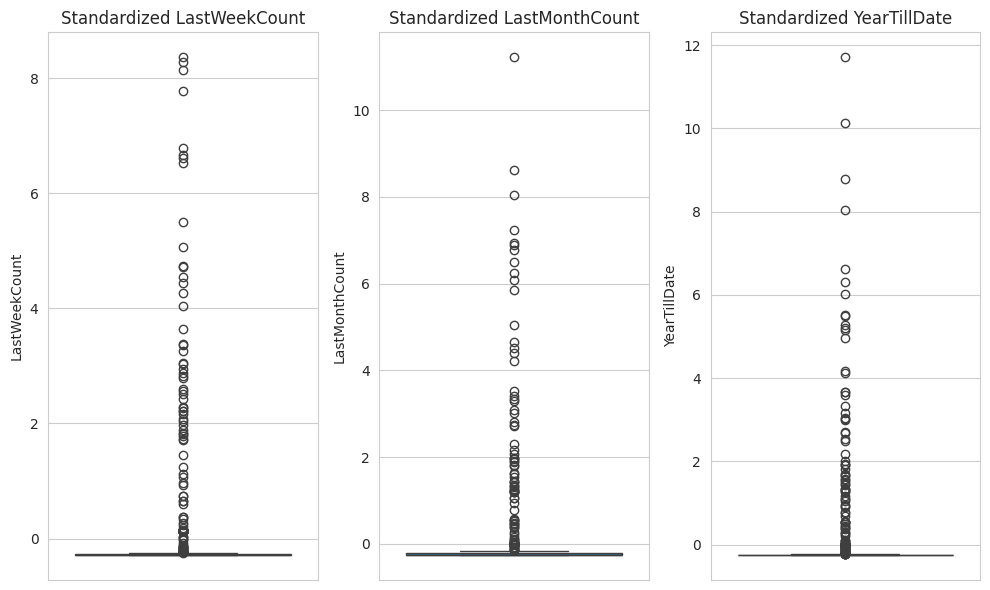

In [ ]:
plt.figure(figsize=(10, 6))

# Box plot for standardized LastWeekCount
plt.subplot(1, 3, 1)
sns.boxplot(y=df_standardized['LastWeekCount'])
plt.title('Standardized LastWeekCount')

# Box plot for standardized LastMonthCount
plt.subplot(1, 3, 2)
sns.boxplot(y=df_standardized['LastMonthCount'])
plt.title('Standardized LastMonthCount')

# Box plot for standardized YearTillDate
plt.subplot(1, 3, 3)
sns.boxplot(y=df_standardized['YearTillDate'])
plt.title('Standardized YearTillDate')

plt.tight_layout()
plt.show()

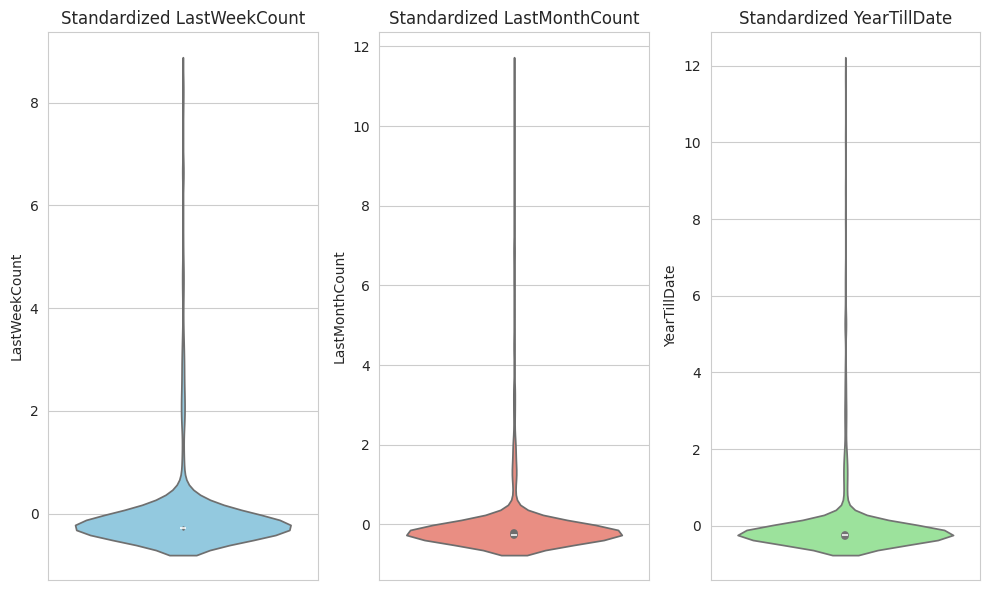

In [ ]:
plt.figure(figsize=(10, 6))

# Violin plot for standardized LastWeekCount
plt.subplot(1, 3, 1)
sns.violinplot(y=df_standardized['LastWeekCount'], color='skyblue')
plt.title('Standardized LastWeekCount')

# Violin plot for standardized LastMonthCount
plt.subplot(1, 3, 2)
sns.violinplot(y=df_standardized['LastMonthCount'], color='salmon')
plt.title('Standardized LastMonthCount')

# Violin plot for standardized YearTillDate
plt.subplot(1, 3, 3)
sns.violinplot(y=df_standardized['YearTillDate'], color='lightgreen')
plt.title('Standardized YearTillDate')

plt.tight_layout()
plt.show()

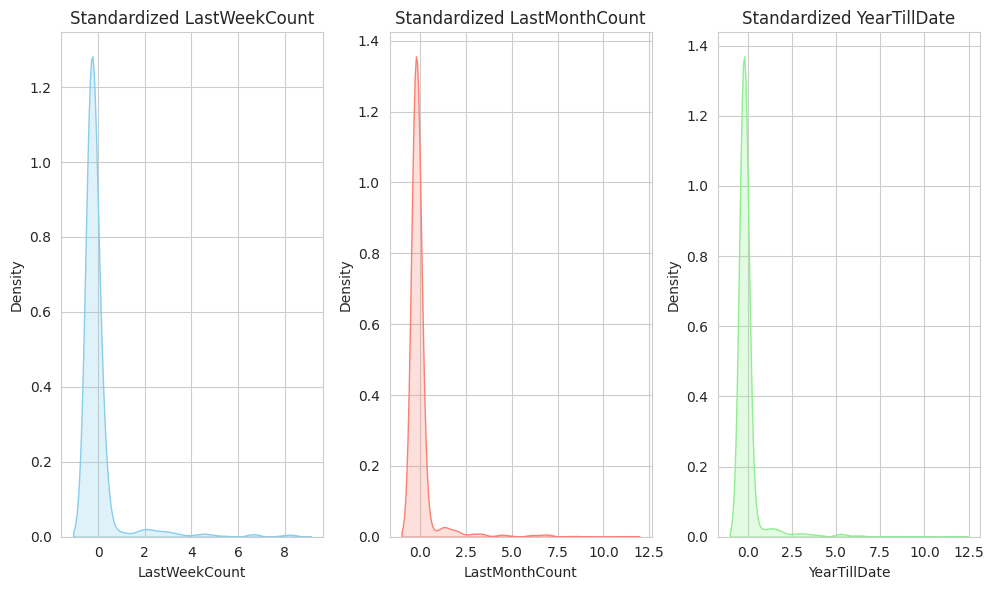

In [ ]:
plt.figure(figsize=(10, 6))

# KDE plot for standardized LastWeekCount
plt.subplot(1, 3, 1)
sns.kdeplot(data=df_standardized['LastWeekCount'], color='skyblue', fill=True)
plt.title('Standardized LastWeekCount')

# KDE plot for standardized LastMonthCount
plt.subplot(1, 3, 2)
sns.kdeplot(data=df_standardized['LastMonthCount'], color='salmon', fill=True)
plt.title('Standardized LastMonthCount')

# KDE plot for standardized YearTillDate
plt.subplot(1, 3, 3)
sns.kdeplot(data=df_standardized['YearTillDate'], color='lightgreen', fill=True)
plt.title('Standardized YearTillDate')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Find categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns

# Create a new DataFrame to store the label-encoded values
df_labelencoded = df.copy()

# Perform label encoding for each categorical column
for column in categorical_columns:
    df_labelencoded[column + '_encoded'] = label_encoder.fit_transform(df[column])

# Drop the original categorical columns
df_labelencoded.drop(columns=categorical_columns, inplace=True)

# Display the first few rows of the DataFrame with label-encoded values
print(df_labelencoded.head())

   LastWeekCount  LastMonthCount  YearTillDate                       Date  \
0    7174.000000         51414.0      567081.0 2019-11-03 04:29:09.831353   
1     160.000000          1368.0       14930.0 2019-11-03 04:29:09.831353   
2    3029.000000         21273.0      233635.0 2019-11-03 04:29:09.831353   
3    4305.000000         31498.0      348282.0 2019-11-03 04:29:09.831353   
4  301803.097812             1.0          15.0 2019-11-03 04:29:09.831353   

   ServiceName_encoded  RpoName_encoded  SchemeType_encoded  
0                    5                0                  16  
1                    5                0                  23  
2                    4                0                   8  
3                    4                0                  13  
4                    4                0                  22  


In [ ]:
enc=df_labelencoded
correlation_matrix = enc.corr()

# Print the correlation matrix
print("Correlation Matrix:")
print(correlation_matrix)

Correlation Matrix:
                     LastWeekCount  LastMonthCount  YearTillDate  \
LastWeekCount             1.000000        0.955442      0.929873   
LastMonthCount            0.955442        1.000000      0.989430   
YearTillDate              0.929873        0.989430      1.000000   
Date                     -0.043546        0.021277      0.033446   
ServiceName_encoded      -0.338670       -0.312401     -0.311782   
RpoName_encoded          -0.027886       -0.032364     -0.036148   
SchemeType_encoded       -0.044935       -0.056487     -0.059286   

                             Date  ServiceName_encoded  RpoName_encoded  \
LastWeekCount       -4.354616e-02        -3.386702e-01    -2.788643e-02   
LastMonthCount       2.127715e-02        -3.124013e-01    -3.236364e-02   
YearTillDate         3.344620e-02        -3.117822e-01    -3.614798e-02   
Date                 1.000000e+00        -1.969229e-16    -1.403934e-14   
ServiceName_encoded -1.969229e-16         1.000000e+00     9

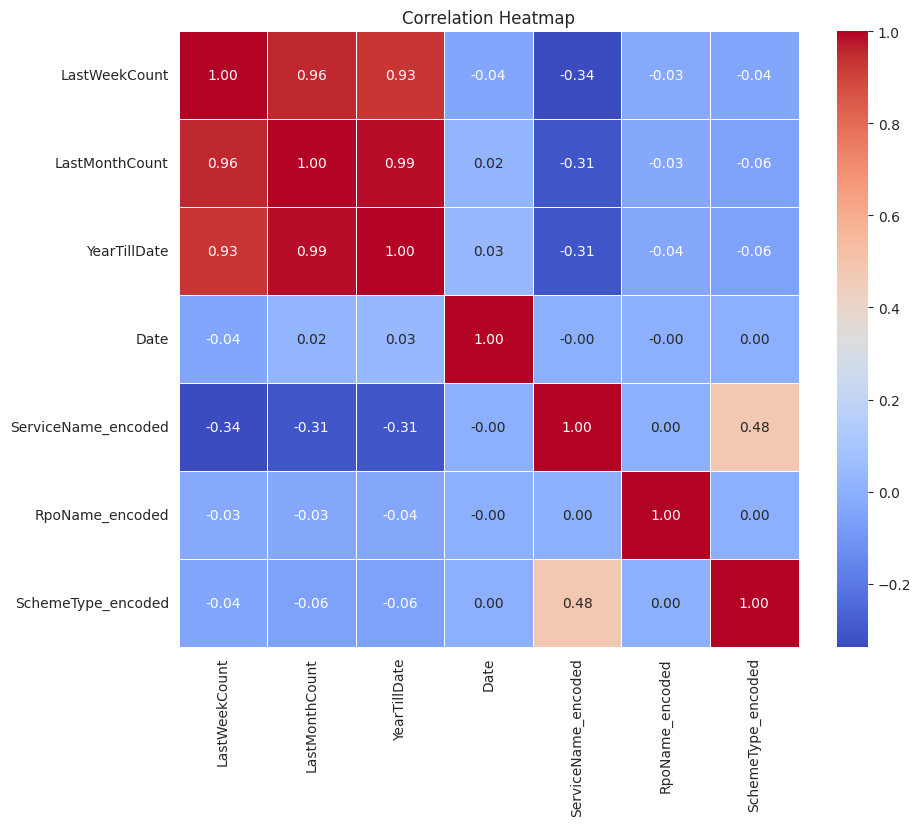

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate correlation matrix
correlation_matrix = df_labelencoded.corr()

# Create heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


In [ ]:
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df['Weekday'] = df['Date'].dt.weekday  # Monday is 0 and Sunday is 6
df['Week'] = df['Date'].dt.isocalendar().week

# Create aggregated statistics
agg_features = ['LastWeekCount', 'LastMonthCount', 'YearTillDate']
agg_windows = [3, 7, 14]  # Define different time windows for aggregation

for window in agg_windows:
    for feature in agg_features:
        # Calculate rolling mean and standard deviation with min_periods parameter
        df[f'{feature}_RollingMean_{window}'] = df[feature].rolling(window, min_periods=1).mean()
        df[f'{feature}_RollingStd_{window}'] = df[feature].rolling(window, min_periods=1).std()

# Display the first few rows of the DataFrame with new features
print(df.head())


                           ServiceName        RpoName   SchemeType  \
0  Applications Received - Scheme wise  RPO Ahmedabad       Normal   
1  Applications Received - Scheme wise  RPO Ahmedabad      Tatkaal   
2  Applications Received - Gender wise  RPO Ahmedabad       FEMALE   
3  Applications Received - Gender wise  RPO Ahmedabad         MALE   
4  Applications Received - Gender wise  RPO Ahmedabad  TRANSGENDER   

   LastWeekCount  LastMonthCount  YearTillDate                       Date  \
0    7174.000000         51414.0      567081.0 2019-11-03 04:29:09.831353   
1     160.000000          1368.0       14930.0 2019-11-03 04:29:09.831353   
2    3029.000000         21273.0      233635.0 2019-11-03 04:29:09.831353   
3    4305.000000         31498.0      348282.0 2019-11-03 04:29:09.831353   
4  301803.097812             1.0          15.0 2019-11-03 04:29:09.831353   

   Year  Month  Day  ...  LastMonthCount_RollingMean_7  \
0  2019     11    3  ...                      51414.00   


In [ ]:
df.isnull().sum()

ServiceName                       0
RpoName                           0
SchemeType                        0
LastWeekCount                    60
LastMonthCount                    0
YearTillDate                      0
Date                              0
Year                              0
Month                             0
Day                               0
Weekday                           0
Week                              0
LastWeekCount_RollingMean_3      16
LastWeekCount_RollingStd_3       35
LastMonthCount_RollingMean_3      0
LastMonthCount_RollingStd_3       1
YearTillDate_RollingMean_3        0
YearTillDate_RollingStd_3         1
LastWeekCount_RollingMean_7       4
LastWeekCount_RollingStd_7        9
LastMonthCount_RollingMean_7      0
LastMonthCount_RollingStd_7       1
YearTillDate_RollingMean_7        0
YearTillDate_RollingStd_7         1
LastWeekCount_RollingMean_14      0
LastWeekCount_RollingStd_14       1
LastMonthCount_RollingMean_14     0
LastMonthCount_RollingStd_14

In [ ]:
df['LastWeekCount'].fillna(df['LastWeekCount'].mean(), inplace=True)
df['LastWeekCount_RollingMean_3'].fillna(df['LastWeekCount_RollingMean_3'].mean(), inplace=True)
df['LastWeekCount_RollingStd_3'].fillna(df['LastWeekCount_RollingStd_3'].mean(), inplace=True)
df['LastMonthCount_RollingStd_3'].fillna(df['LastMonthCount_RollingStd_3'].mean(), inplace=True)
df['YearTillDate_RollingStd_3'].fillna(df['YearTillDate_RollingStd_3'].mean(), inplace=True)
df['LastWeekCount_RollingMean_7'].fillna(df['LastWeekCount_RollingMean_7'].mean(), inplace=True)
df['LastWeekCount_RollingStd_7'].fillna(df['LastWeekCount_RollingStd_7'].mean(), inplace=True)
df['LastMonthCount_RollingStd_7'].fillna(df['LastMonthCount_RollingStd_7'].mean(), inplace=True)
df['YearTillDate_RollingStd_7'].fillna(df['YearTillDate_RollingStd_7'].mean(), inplace=True)
df['LastWeekCount_RollingStd_14'].fillna(df['LastWeekCount_RollingStd_14'].mean(), inplace=True)
df['LastMonthCount_RollingStd_14'].fillna(df['LastMonthCount_RollingStd_14'].mean(), inplace=True)
df['YearTillDate_RollingStd_14'].fillna(df['YearTillDate_RollingStd_14'].mean(), inplace=True)


df.isnull().sum()

ServiceName                      0
RpoName                          0
SchemeType                       0
LastWeekCount                    0
LastMonthCount                   0
YearTillDate                     0
Date                             0
Year                             0
Month                            0
Day                              0
Weekday                          0
Week                             0
LastWeekCount_RollingMean_3      0
LastWeekCount_RollingStd_3       0
LastMonthCount_RollingMean_3     0
LastMonthCount_RollingStd_3      0
YearTillDate_RollingMean_3       0
YearTillDate_RollingStd_3        0
LastWeekCount_RollingMean_7      0
LastWeekCount_RollingStd_7       0
LastMonthCount_RollingMean_7     0
LastMonthCount_RollingStd_7      0
YearTillDate_RollingMean_7       0
YearTillDate_RollingStd_7        0
LastWeekCount_RollingMean_14     0
LastWeekCount_RollingStd_14      0
LastMonthCount_RollingMean_14    0
LastMonthCount_RollingStd_14     0
YearTillDate_Rolling

In [ ]:
df_log = df.copy()
df_log[['LastWeekCount', 'LastMonthCount', 'YearTillDate']] = df_log[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].apply(lambda x: np.log(x + 1))

# Square root transformation
df_sqrt = df.copy()
df_sqrt[['LastWeekCount', 'LastMonthCount', 'YearTillDate']] = df_sqrt[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].apply(lambda x: np.sqrt(x))

# Box-Cox transformation
from scipy.stats import boxcox

df_boxcox = df.copy()
df_boxcox[['LastWeekCount', 'LastMonthCount', 'YearTillDate']] = df_boxcox[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].apply(lambda x: boxcox(x + 1)[0])  # Adding 1 to avoid zero values

# Display the first few rows of the transformed DataFrames
print("Log Transformation:")
print(df_log.head())

print("\nSquare Root Transformation:")
print(df_sqrt.head())

print("\nBox-Cox Transformation:")
print(df_boxcox.head())

Log Transformation:
                           ServiceName        RpoName   SchemeType  \
0  Applications Received - Scheme wise  RPO Ahmedabad       Normal   
1  Applications Received - Scheme wise  RPO Ahmedabad      Tatkaal   
2  Applications Received - Gender wise  RPO Ahmedabad       FEMALE   
3  Applications Received - Gender wise  RPO Ahmedabad         MALE   
4  Applications Received - Gender wise  RPO Ahmedabad  TRANSGENDER   

   LastWeekCount  LastMonthCount  YearTillDate                       Date  \
0       8.878358       10.847685     13.248259 2019-11-03 04:29:09.831353   
1       5.081404        7.221836      9.611195 2019-11-03 04:29:09.831353   
2       8.016318        9.965241     12.361520 2019-11-03 04:29:09.831353   
3       8.367765       10.357711     12.760771 2019-11-03 04:29:09.831353   
4      12.617533        0.693147      2.772589 2019-11-03 04:29:09.831353   

   Year  Month  Day  ...  LastMonthCount_RollingMean_7  \
0  2019     11    3  ...              

<ipython-input-38-e75aaf2b2671>:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[0, 0], bins=20, color='skyblue', alpha=0.7)
<ipython-input-38-e75aaf2b2671>:10: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_log[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[0, 1], bins=20, color='lightgreen', alpha=0.7)
<ipython-input-38-e75aaf2b2671>:16: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_sqrt[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[0, 2], bins=20, color='salmon', alpha=0.7)
<ipython-input-38-e75aaf2b2671>:22: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df_boxcox[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[1, 0], bins=20, color='orange',

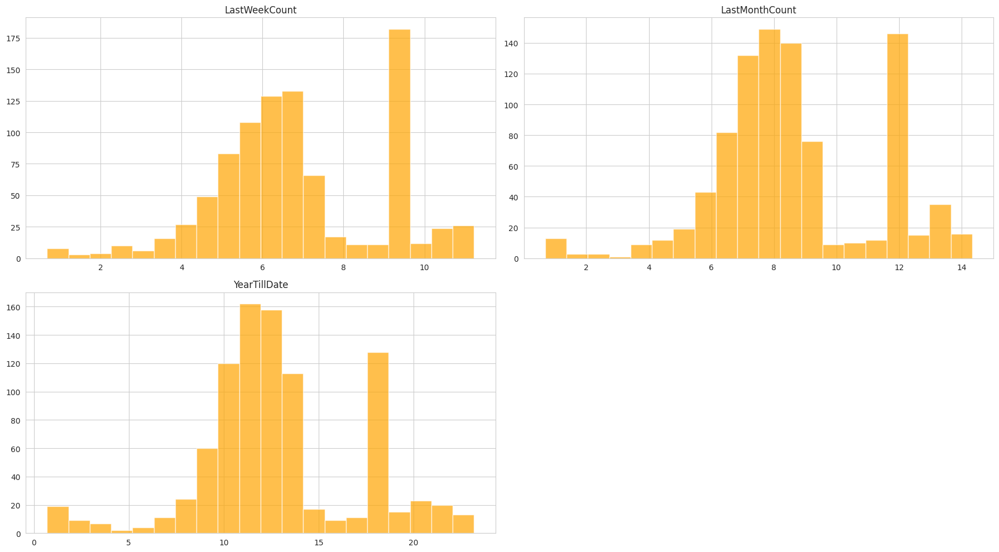

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

# Original data
df[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[0, 0], bins=20, color='skyblue', alpha=0.7)
axes[0, 0].set_title('Original Data')
axes[0, 0].set_xlabel('Value')
axes[0, 0].set_ylabel('Frequency')

# Log transformation
df_log[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[0, 1], bins=20, color='lightgreen', alpha=0.7)
axes[0, 1].set_title('Log Transformation')
axes[0, 1].set_xlabel('Value')
axes[0, 1].set_ylabel('Frequency')

# Square root transformation
df_sqrt[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[0, 2], bins=20, color='salmon', alpha=0.7)
axes[0, 2].set_title('Square Root Transformation')
axes[0, 2].set_xlabel('Value')
axes[0, 2].set_ylabel('Frequency')

# Box-Cox transformation
df_boxcox[['LastWeekCount', 'LastMonthCount', 'YearTillDate']].hist(ax=axes[1, 0], bins=20, color='orange', alpha=0.7)
axes[1, 0].set_title('Box-Cox Transformation')
axes[1, 0].set_xlabel('Value')
axes[1, 0].set_ylabel('Frequency')

# Show plot
plt.tight_layout()
plt.show()

Correlation Matrix of All Numerical Values:
                               LastWeekCount  LastMonthCount  YearTillDate  \
LastWeekCount                       1.000000        0.633708      0.617163   
LastMonthCount                      0.633708        1.000000      0.989430   
YearTillDate                        0.617163        0.989430      1.000000   
Year                               -0.041356        0.021277      0.033446   
Month                               0.041356       -0.021277     -0.033446   
Day                                 0.041356       -0.021277     -0.033446   
Weekday                                  NaN             NaN           NaN   
Week                                0.041356       -0.021277     -0.033446   
LastWeekCount_RollingMean_3         0.510339        0.389610      0.380487   
LastWeekCount_RollingStd_3          0.614101        0.518452      0.503666   
LastMonthCount_RollingMean_3        0.467283        0.627341      0.632138   
LastMonthCount_Rolli

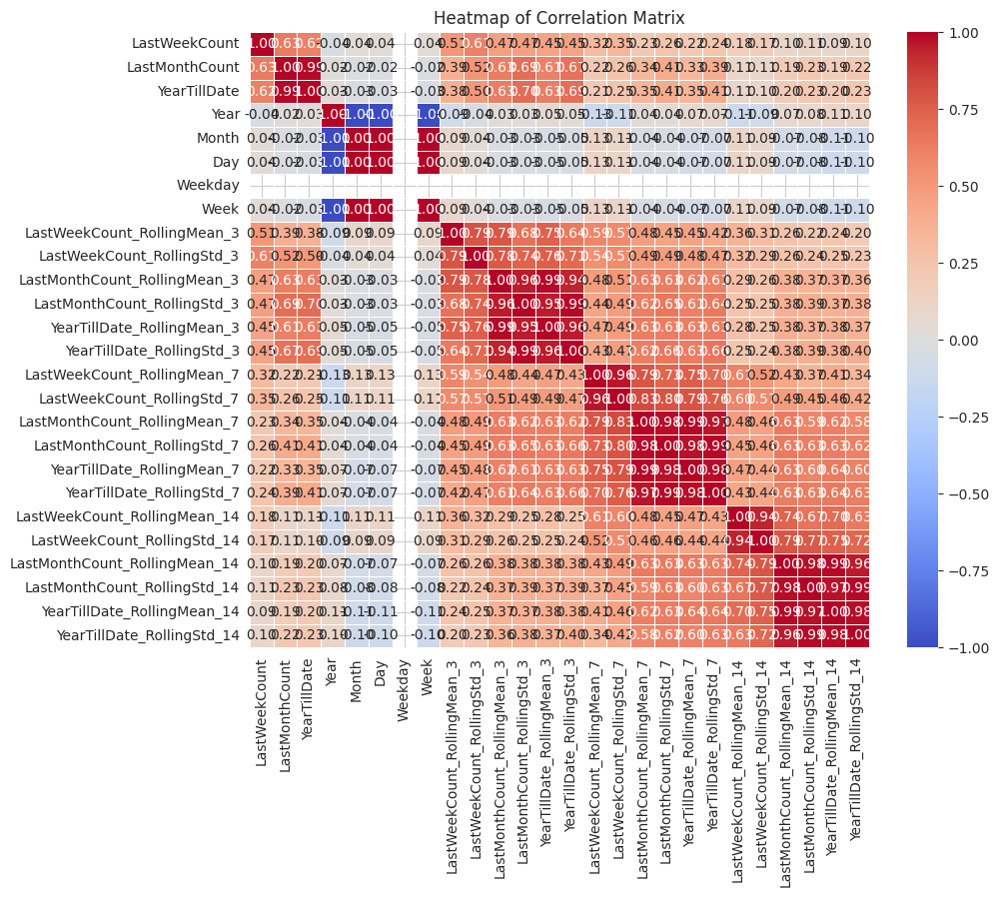

In [ ]:
numerical_columns = df.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical values
correlation_matrix_numerical = numerical_columns.corr()

# Display the correlation matrix
print("Correlation Matrix of All Numerical Values:")
print(correlation_matrix_numerical)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix_numerical, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Heatmap of Correlation Matrix')
plt.show()

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


# Let's assume 'Service name', 'RPO name', and 'scheme type' are categorical features
# and 'last week count', 'Last month count', 'Year till date' are numerical features

# Separate features and target variable
X = df.drop(['Date'], axis=1)  # Assuming 'date' is not a feature for selection
y = df['Date']

# Convert categorical variables into dummy/indicator variables
X = pd.get_dummies(X)

# Apply feature selection using SelectKBest with chi-squared statistical test
# Here, k represents the number of top features to select
# You can adjust the value of k based on your requirements
k = 4  # Select top 4 features
best_features = SelectKBest(score_func=chi2, k=k)
fit = best_features.fit(X, y)

# Get the scores and p-values for each feature
scores = pd.DataFrame(fit.scores_)
pvalues = pd.DataFrame(fit.pvalues_)
columns = pd.DataFrame(X.columns)

# Concatenate scores, p-values, and column names into a single DataFrame
feature_scores = pd.concat([columns, scores, pvalues], axis=1)
feature_scores.columns = ['Feature', 'Score', 'P-Value']

# Sort features by score in descending order
feature_scores = feature_scores.sort_values(by='Score', ascending=False)

# Print the top k features
print("Top", k, "selected features:")
print(feature_scores.head(k))


Top 4 selected features:
                       Feature         Score  P-Value
25  YearTillDate_RollingStd_14  5.261175e+08      0.0
19   YearTillDate_RollingStd_7  3.836048e+08      0.0
13   YearTillDate_RollingStd_3  2.580987e+08      0.0
2                 YearTillDate  2.243897e+08      0.0


In [ ]:
correlation_threshold = 0.8

# Find pairs of features with correlation above the threshold
correlation_pairs = (correlation_matrix_numerical.abs() > correlation_threshold) & (correlation_matrix_numerical.abs() < 1)

# Get the columns to drop
columns_to_drop = set()
for i in range(len(correlation_pairs.columns)):
    for j in range(i+1, len(correlation_pairs.columns)):
        if correlation_pairs.iloc[i, j]:
            columns_to_drop.add(correlation_pairs.columns[i])

# Drop the highly correlated columns
df_selected = df.drop(columns=columns_to_drop)

# Display the selected DataFrame
print("Selected DataFrame after feature selection:")
print(df_selected.head())

Selected DataFrame after feature selection:
                           ServiceName        RpoName   SchemeType  \
0  Applications Received - Scheme wise  RPO Ahmedabad       Normal   
1  Applications Received - Scheme wise  RPO Ahmedabad      Tatkaal   
2  Applications Received - Gender wise  RPO Ahmedabad       FEMALE   
3  Applications Received - Gender wise  RPO Ahmedabad         MALE   
4  Applications Received - Gender wise  RPO Ahmedabad  TRANSGENDER   

   LastWeekCount  YearTillDate                       Date  Month  Day  \
0    7174.000000      567081.0 2019-11-03 04:29:09.831353     11    3   
1     160.000000       14930.0 2019-11-03 04:29:09.831353     11    3   
2    3029.000000      233635.0 2019-11-03 04:29:09.831353     11    3   
3    4305.000000      348282.0 2019-11-03 04:29:09.831353     11    3   
4  301803.097812          15.0 2019-11-03 04:29:09.831353     11    3   

   Weekday  Week  LastWeekCount_RollingMean_3  LastWeekCount_RollingStd_3  \
0        6    44   

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


numerical_features = df_selected.select_dtypes(include=['number'])

# Separate selected features and target variable
X = numerical_features.drop(columns=['YearTillDate'])
y = numerical_features['YearTillDate']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Choose model (Linear Regression)
model = LinearRegression()

# Fit the model using training data
model.fit(X_train, y_train)

# Evaluate model performance
train_rmse = mean_squared_error(y_train, model.predict(X_train), squared=False)
test_rmse = mean_squared_error(y_test, model.predict(X_test), squared=False)

print("Train RMSE:", train_rmse)
print("Test RMSE:", test_rmse)

Train RMSE: 27196294.16118786
Test RMSE: 50859922.283722624


In [ ]:
X = df_selected[['LastWeekCount_RollingMean_3', 'LastWeekCount_RollingStd_3']]
y = df_selected['LastWeekCount']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Choosing a model (Linear Regression)
model = LinearRegression()

# Fitting the model using training data
model.fit(X_train, y_train)

# Predicting the LastWeekCount for training and testing data
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Evaluating model performance using RMSE
train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)

print("Train RMSE:", train_rmse)
print("Test RMSE:", test_rmse)

Train RMSE: 544276.7470076183
Test RMSE: 617466.4021264875


## **DataSet-1 (Passport Dispatch)**

In [ ]:
df=pd.read_csv('/content/datafile-5.csv')

In [ ]:
df.head()

,RPO Name,Dispatch on Same Day,Dispatch in 1 days,Dispatch in 2 - 3 days,Dispatch in 4 - 7 days,Dispatch in 8 - 14 days,Dispatch in 15 - 21 days,Dispatch in 22 - 30 days,Dispatch in more than 30 days,Total
0,CPV Delhi,107,274,301,664,421,259,108,636,2770
1,RPO Ahmedabad,5996,734,18252,84677,86716,103933,134725,109180,544213
2,RPO Amritsar,88,7625,9488,7248,29579,41864,15055,17802,128749
3,RPO Bangalore,444,26349,106424,88492,65579,68181,89498,173448,618415
4,RPO Bareilly,43,1843,939,2822,8665,15132,55842,83717,169003


In [ ]:
df.isnull().sum()

RPO Name                         0
Dispatch on Same Day             0
Dispatch in 1 days               0
Dispatch in 2 - 3 days           0
Dispatch in 4 - 7 days           0
Dispatch in 8 - 14 days          0
Dispatch in 15 - 21 days         0
Dispatch in 22 - 30 days         0
Dispatch in more than 30 days    0
Total                            0
dtype: int64

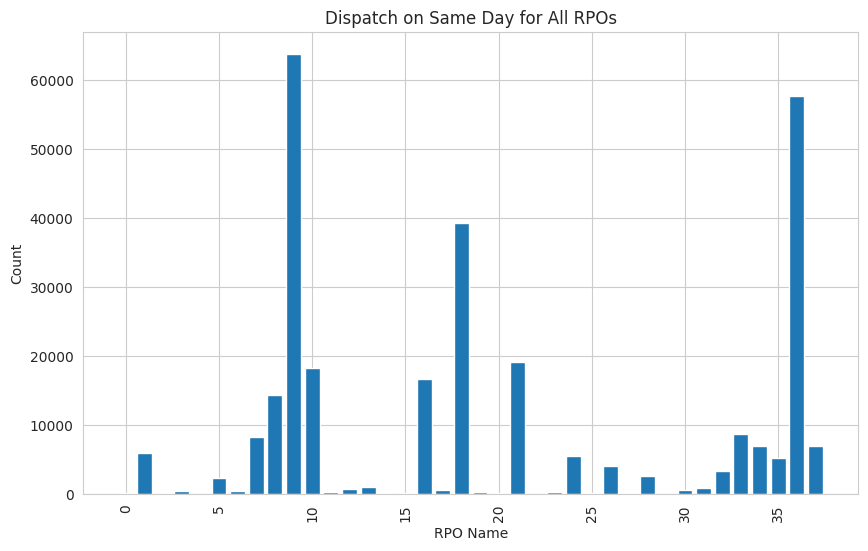

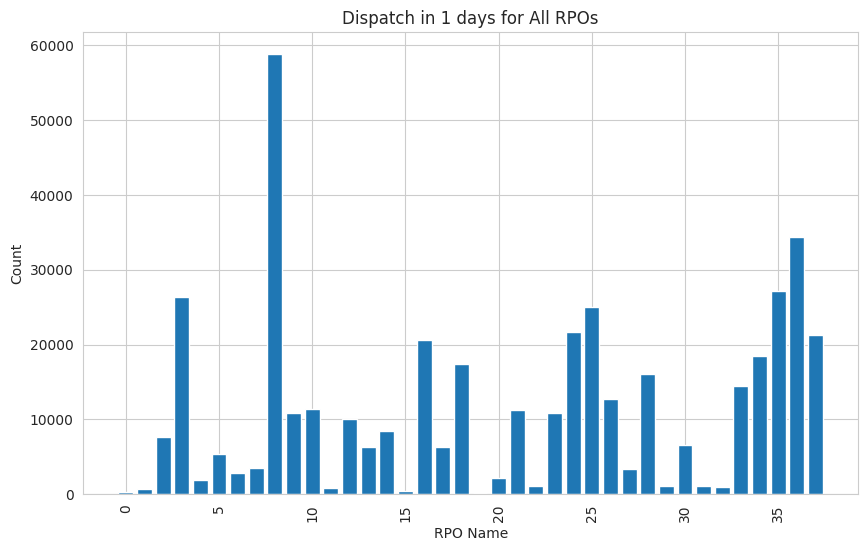

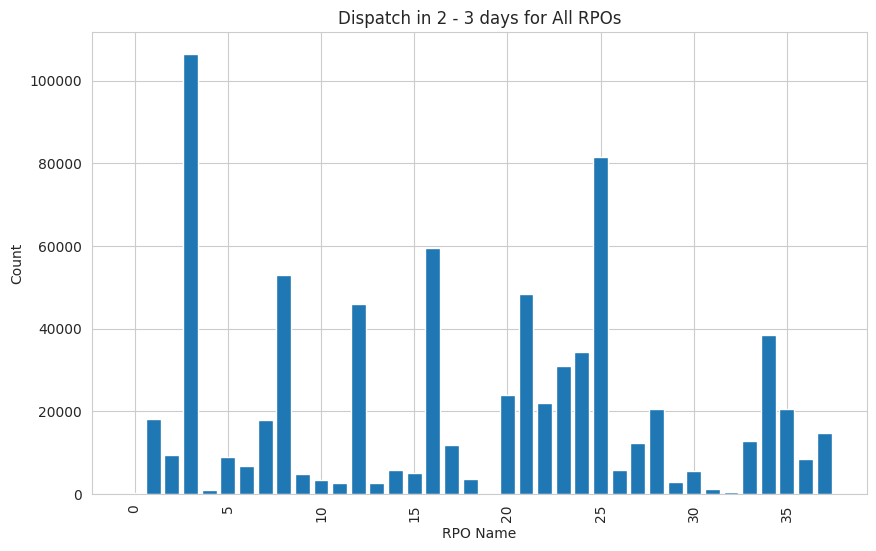

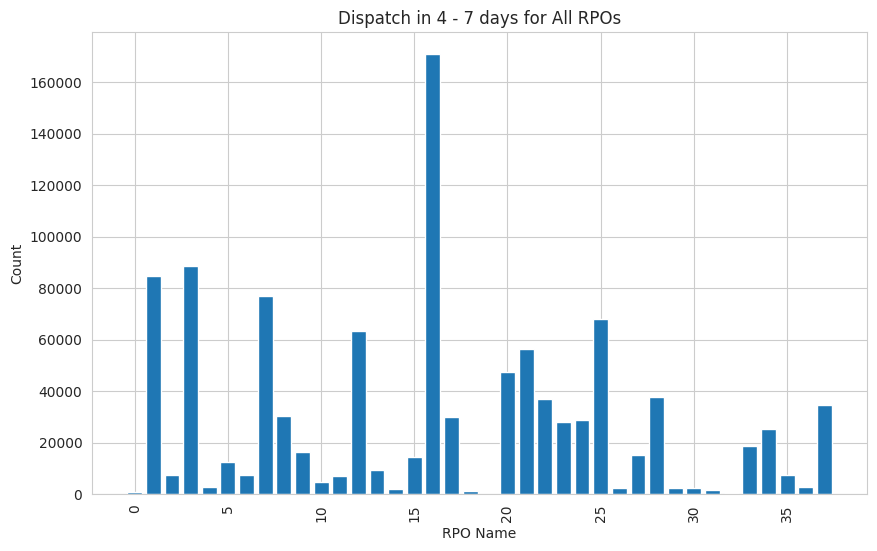

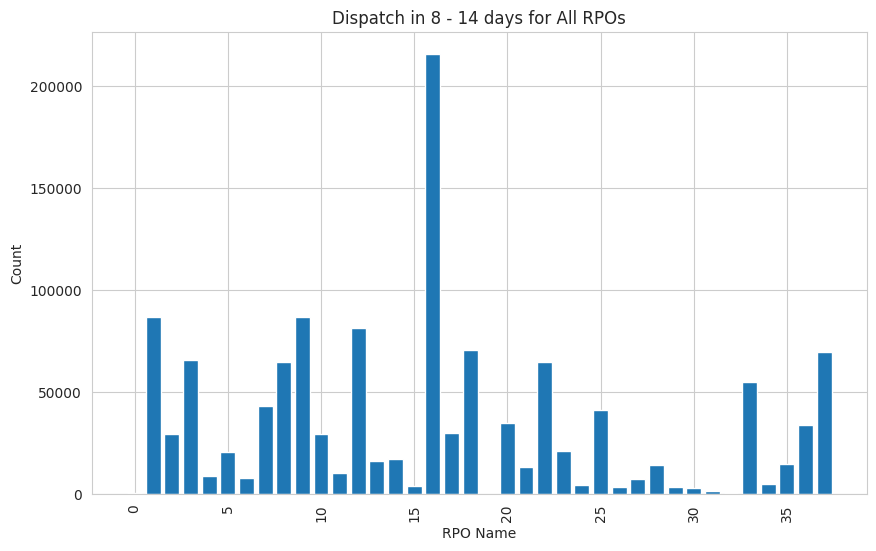

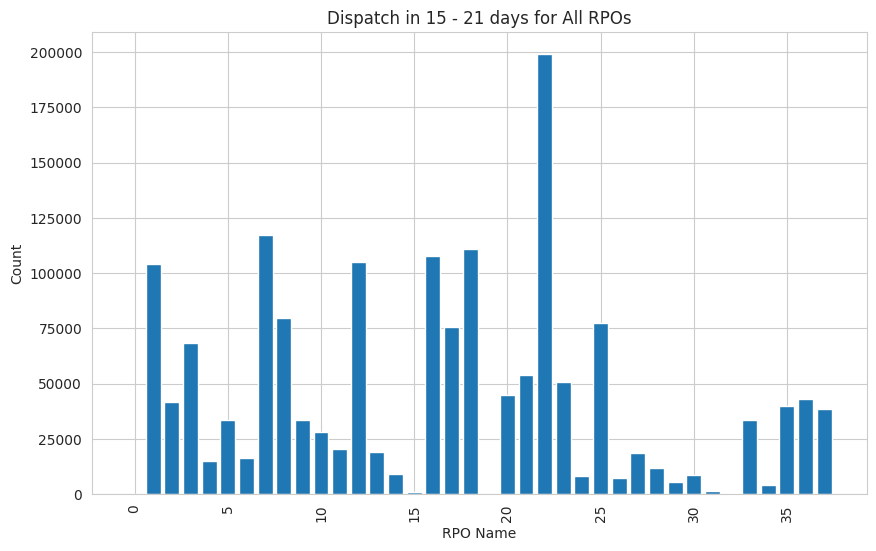

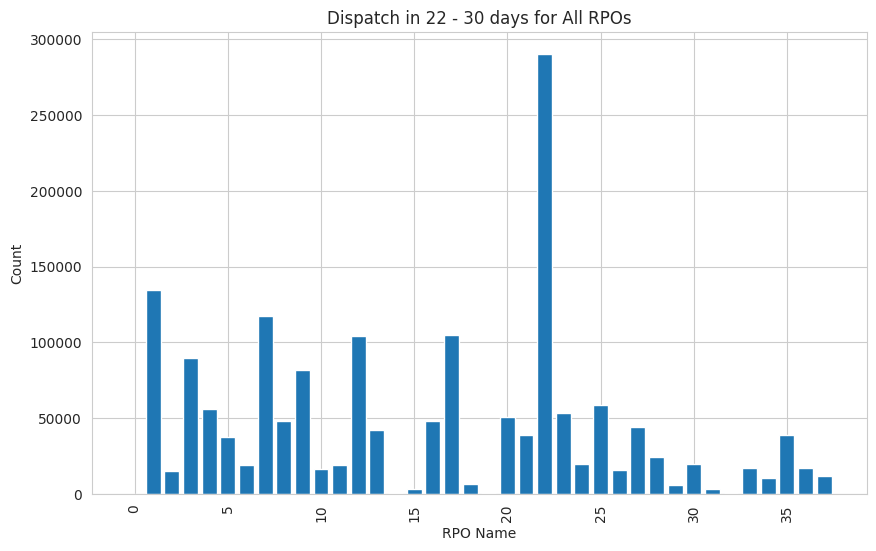

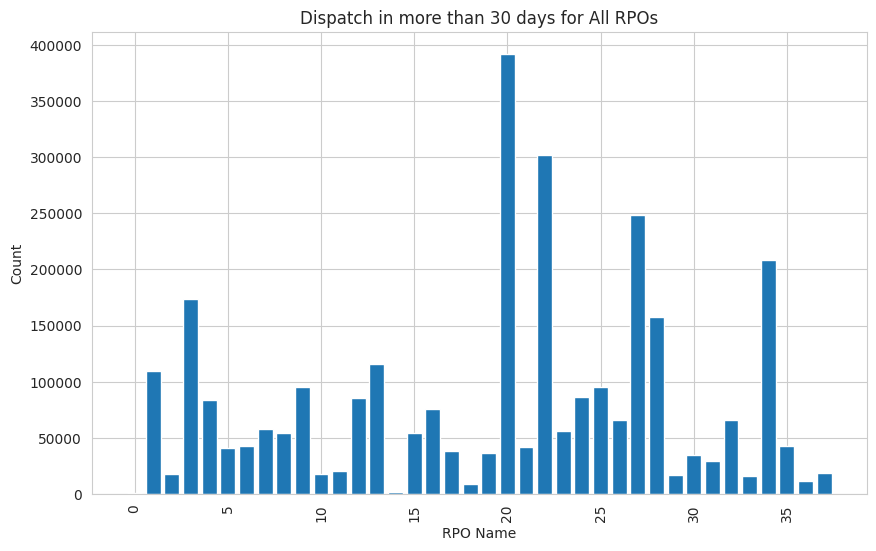

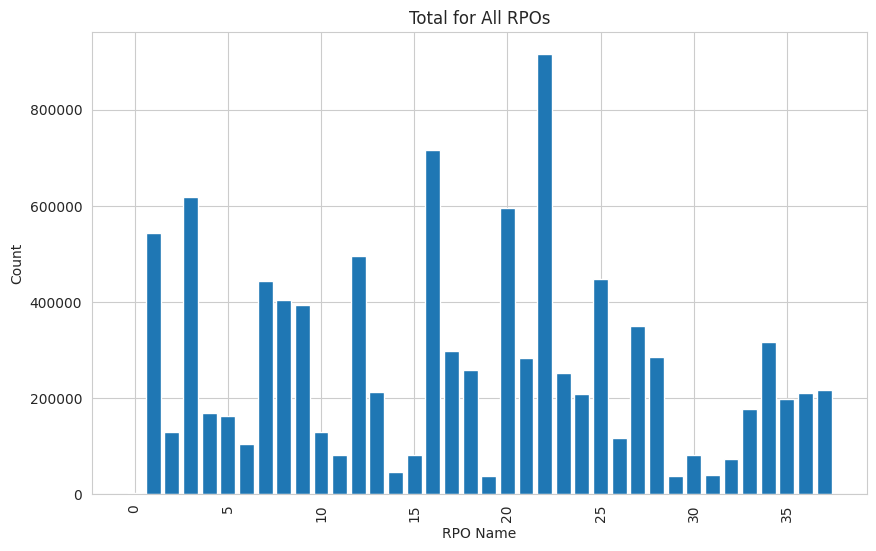

In [ ]:
dispatch_durations = df.columns[1:]  # Exclude the first column 'RPO Name'

# Plot bar plot for each dispatch duration for all RPOs
for duration in dispatch_durations:
    plt.figure(figsize=(10, 6))  # Adjust figure size if needed
    plt.bar(df.index, df[duration])
    plt.title(f'{duration} for All RPOs')
    plt.xlabel('RPO Name')
    plt.ylabel('Count')
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.show()

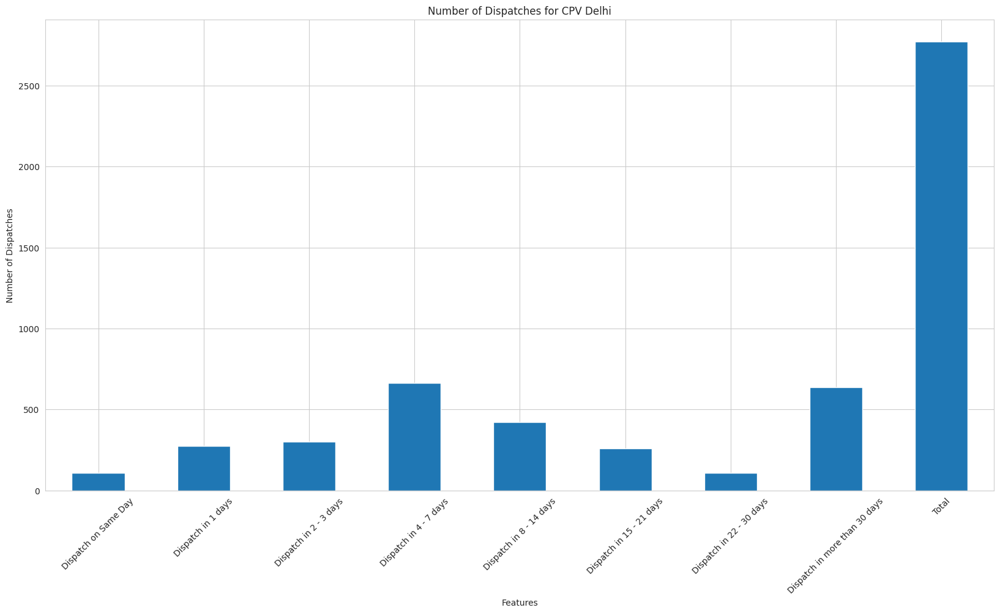

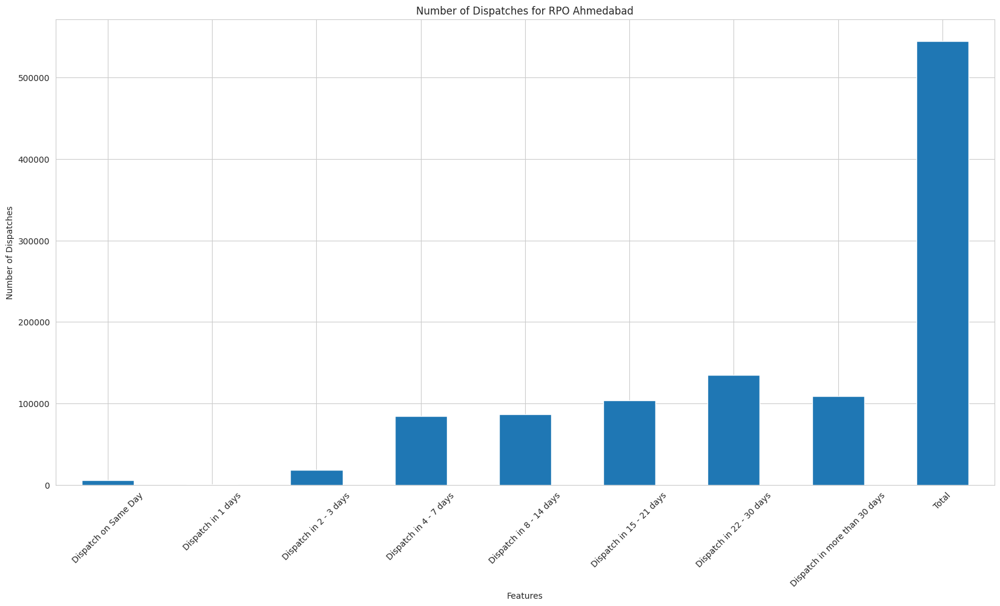

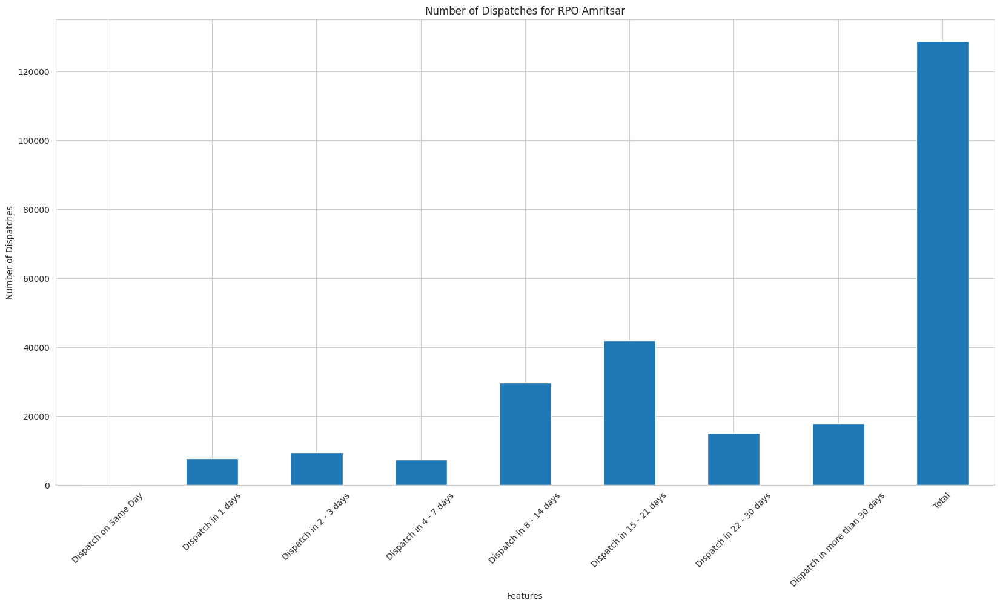

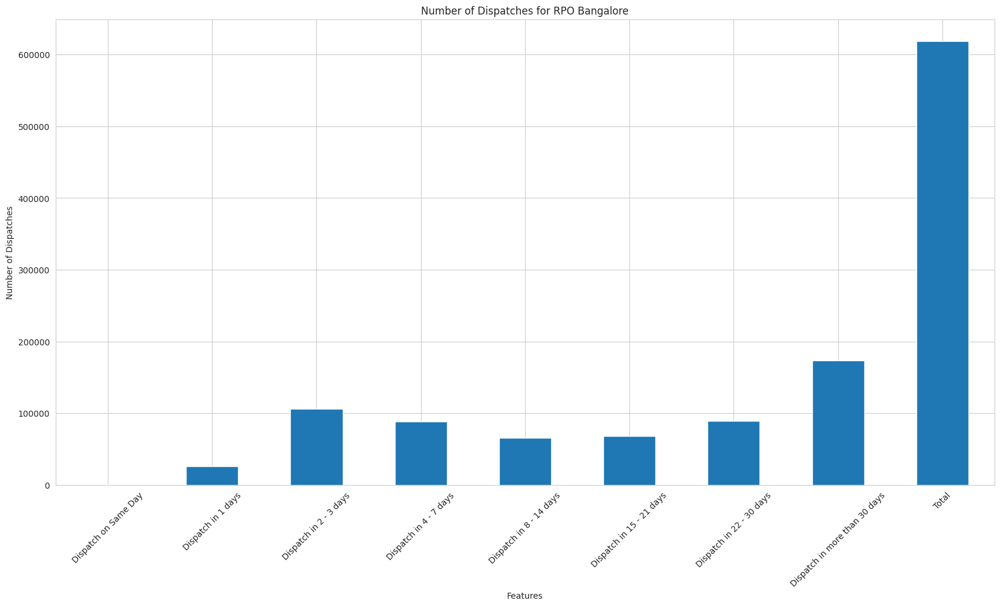

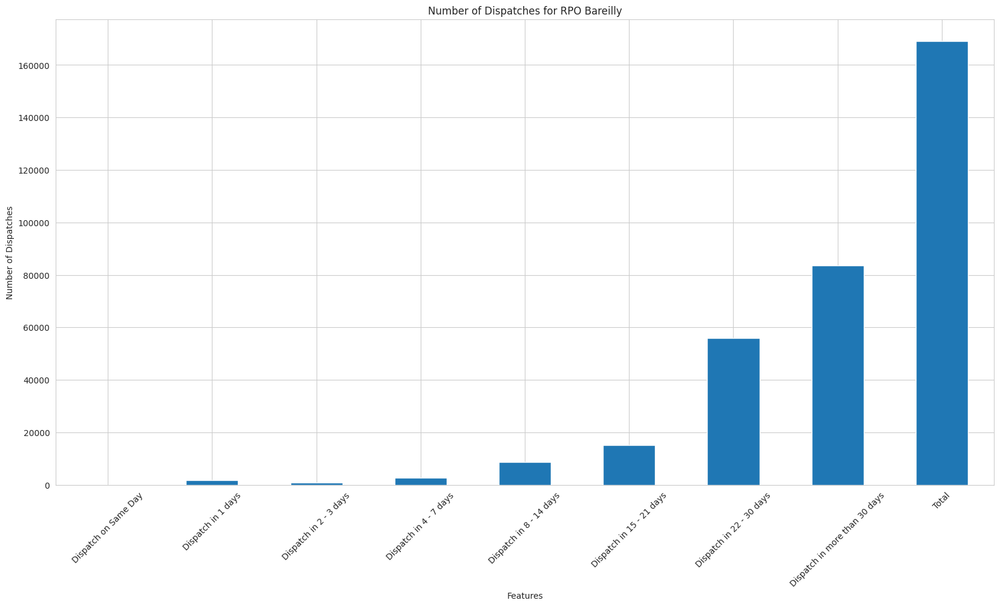

...

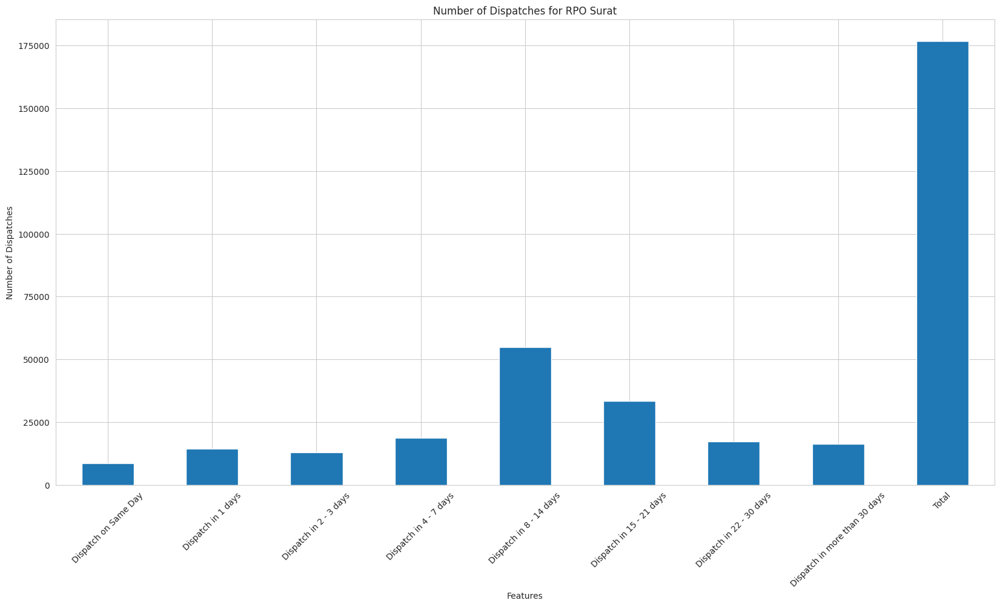

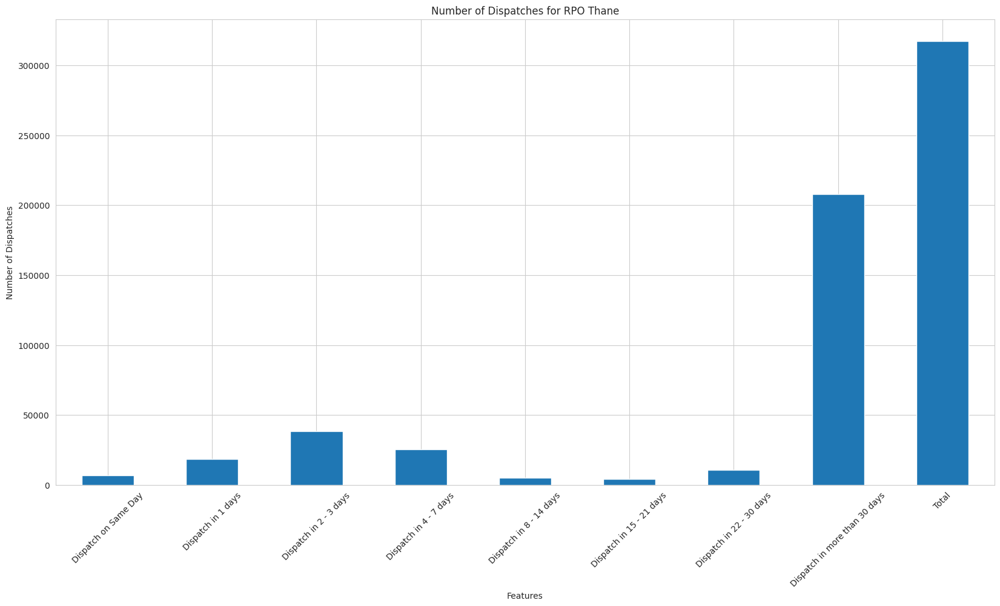

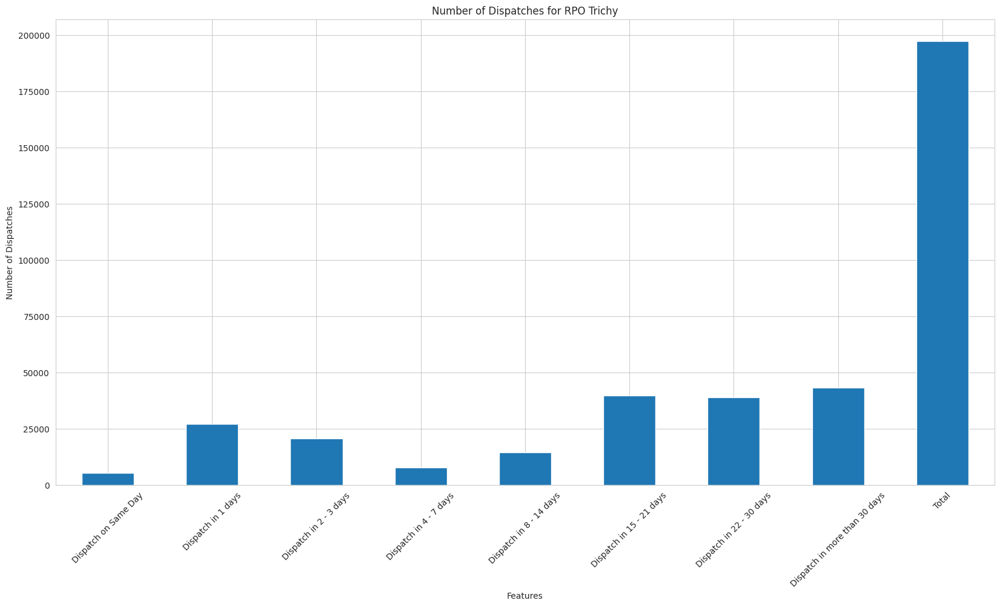

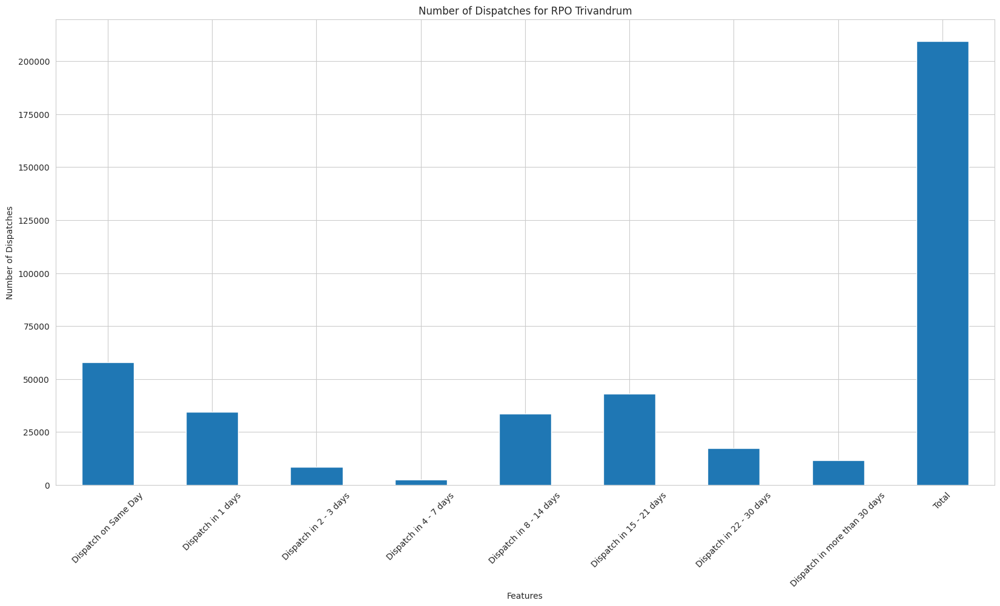

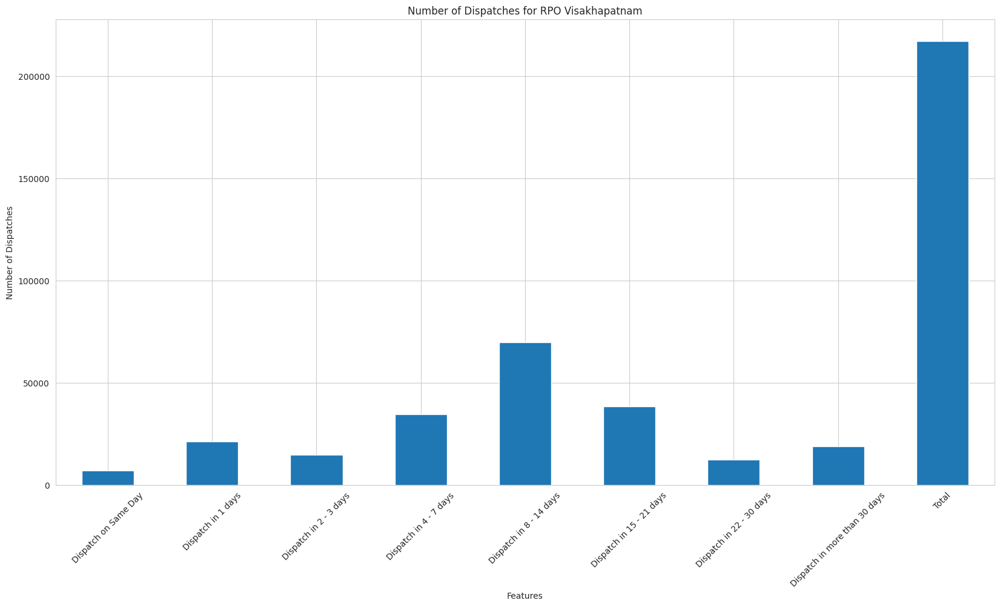

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have the DataFrame 'df' already created

# Group DataFrame by 'Rpo Name'
grouped_df = df.groupby('RPO Name').sum()

# Plot bar graph for each group
for rpo_name, dispatch_features in grouped_df.iterrows():
    dispatch_features.plot(kind='bar')
    plt.title(f'Number of Dispatches for {rpo_name}')
    plt.xlabel('Features')
    plt.ylabel('Number of Dispatches')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.show()

In [ ]:
df.iloc[:, 1:-1] = df.iloc[:, 1:-1].apply(pd.to_numeric, errors='coerce')

df.iloc[:, 1:-1] = df.iloc[:, 1:-1].apply(pd.to_numeric, errors='coerce')

# Find the column label of the maximum value across all features for each RPO row
max_feature_per_rpo = df.iloc[:, 1:-1].idxmax(axis=1)

# Find the maximum value across all features for each RPO row
max_value_per_rpo = df.iloc[:, 1:-1].max(axis=1)

# Set 'Rpo Name' as index
max_feature_per_rpo.index = df.index
max_value_per_rpo.index = df.index

# Combine results into a DataFrame
result_df = pd.DataFrame({'Highest Value': max_value_per_rpo, 'Feature': max_feature_per_rpo})

print(result_df)

    Highest Value                        Feature
0             664         Dispatch in 4 - 7 days
1          134725       Dispatch in 22 - 30 days
2           41864       Dispatch in 15 - 21 days
3          173448  Dispatch in more than 30 days
4           83717  Dispatch in more than 30 days
5           41364  Dispatch in more than 30 days
6           42745  Dispatch in more than 30 days
7          117309       Dispatch in 22 - 30 days
8           79564       Dispatch in 15 - 21 days
9           94989  Dispatch in more than 30 days
10          29489        Dispatch in 8 - 14 days
11          20422  Dispatch in more than 30 days
12         105102       Dispatch in 15 - 21 days
13         115661  Dispatch in more than 30 days
14          16980        Dispatch in 8 - 14 days
15          54242  Dispatch in more than 30 days
16         215722        Dispatch in 8 - 14 days
17         104838       Dispatch in 22 - 30 days
18         110667       Dispatch in 15 - 21 days
19          36865  D

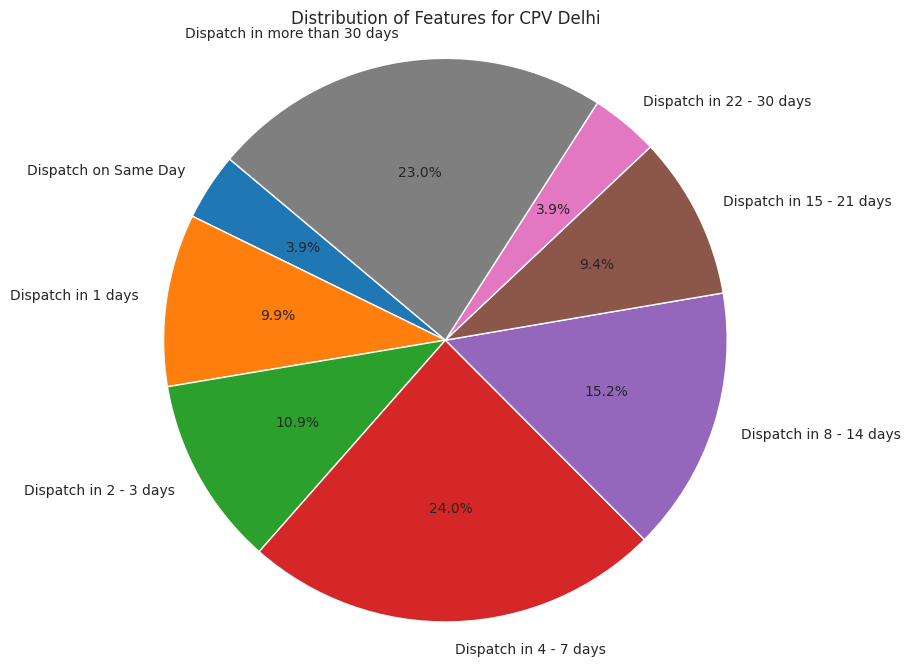

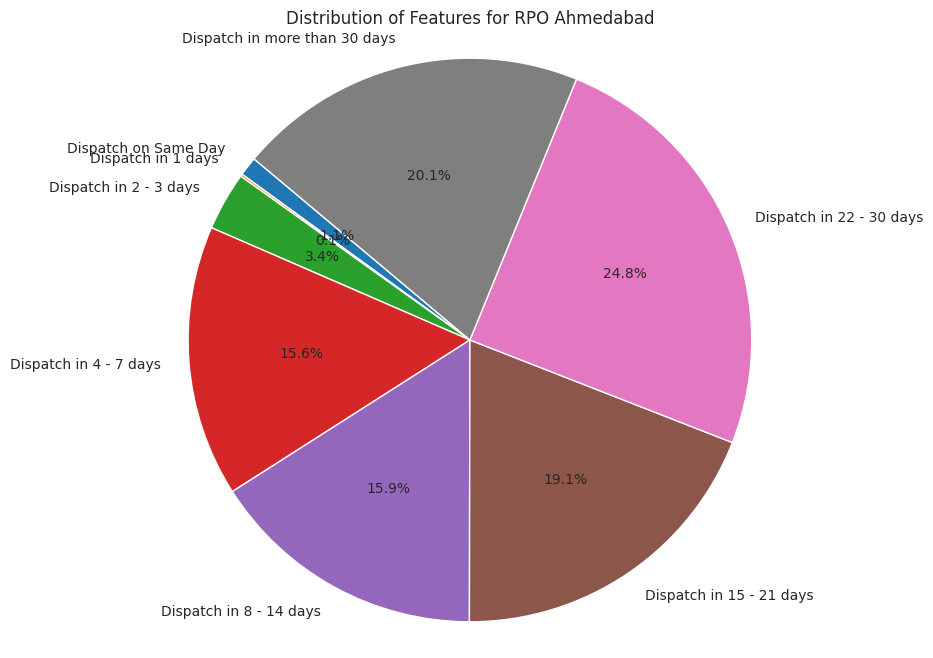

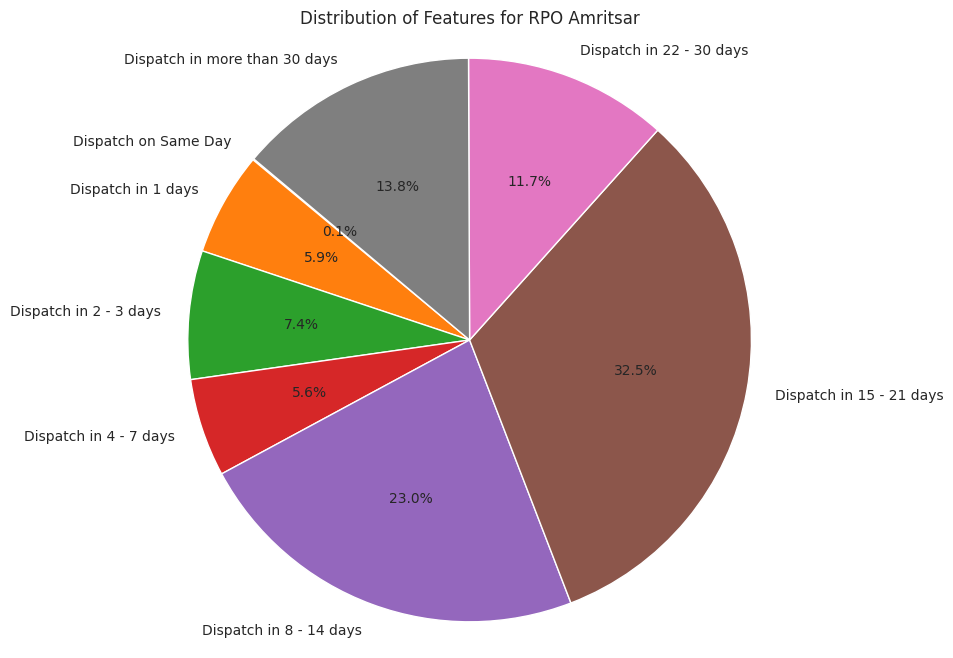

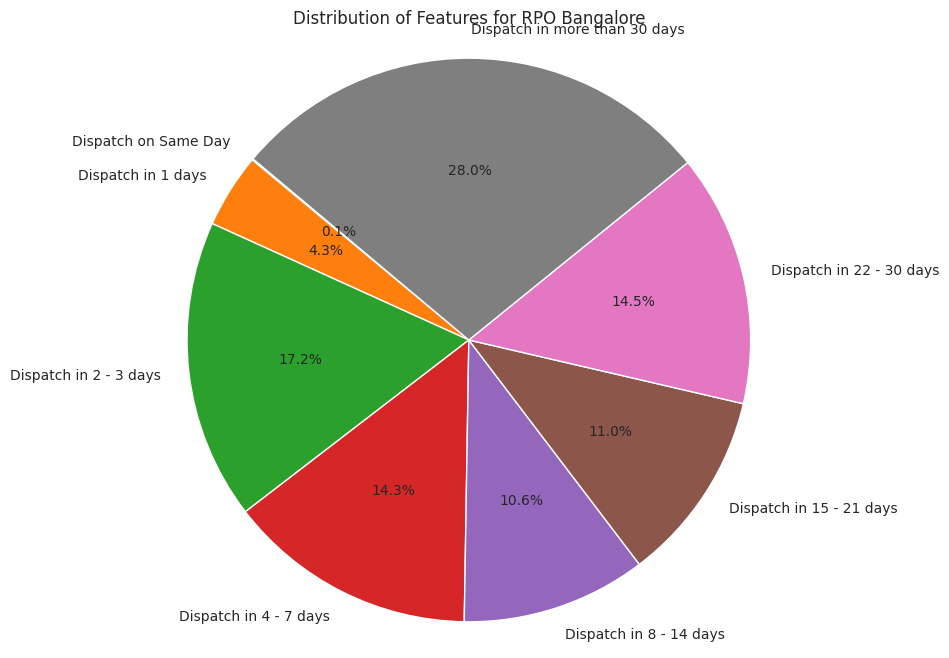

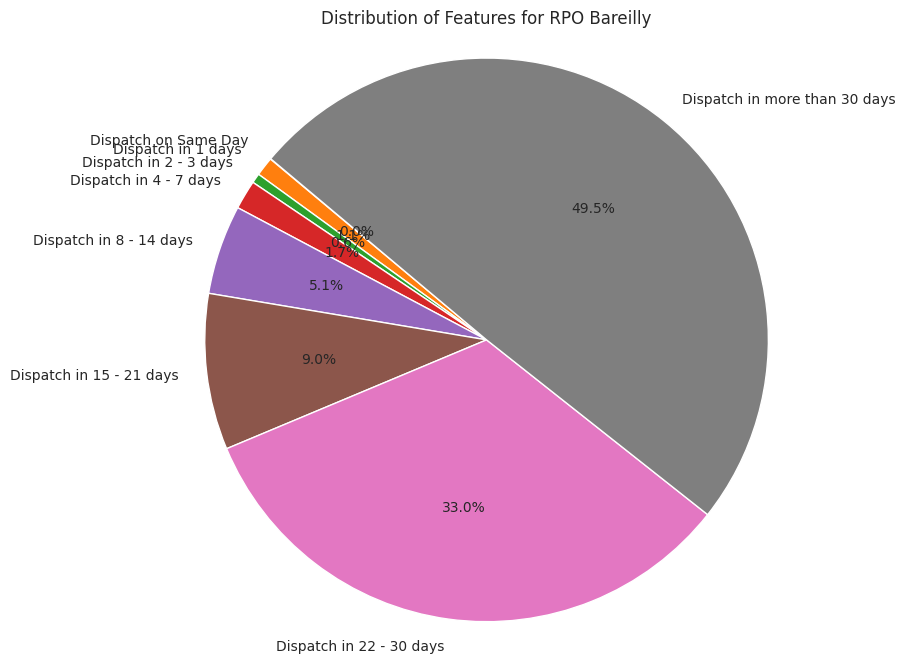

...

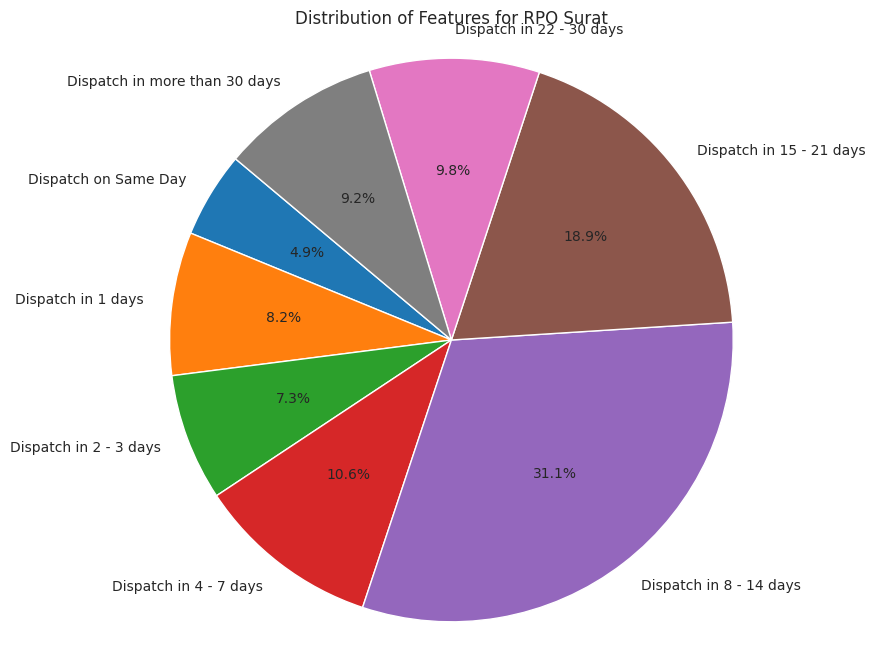

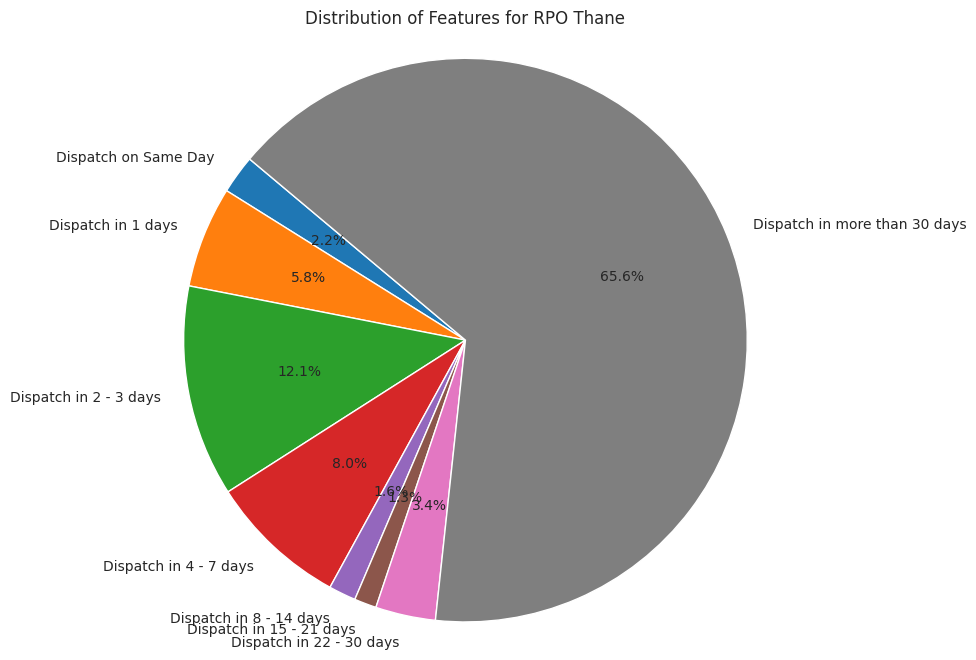

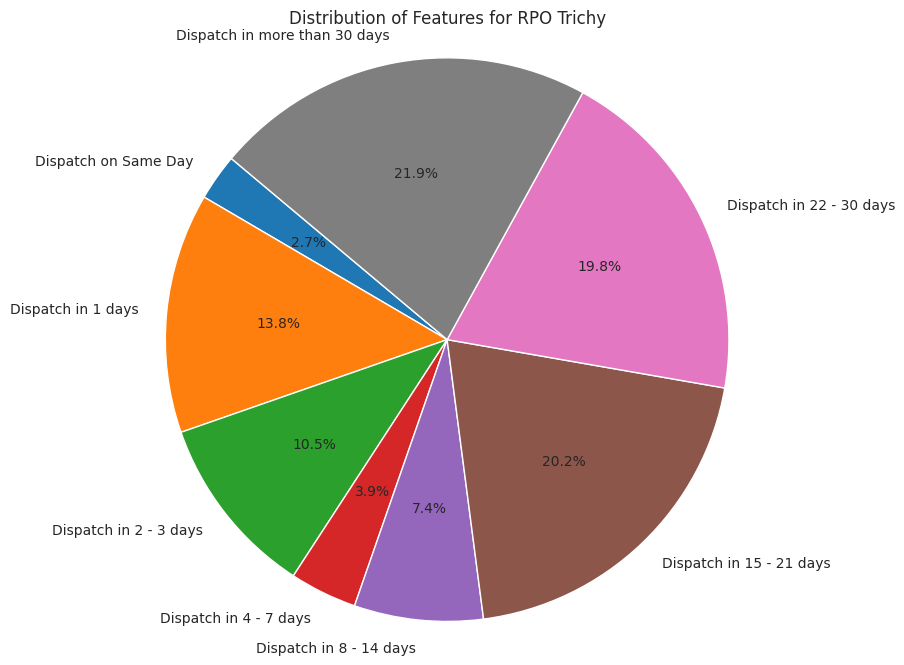

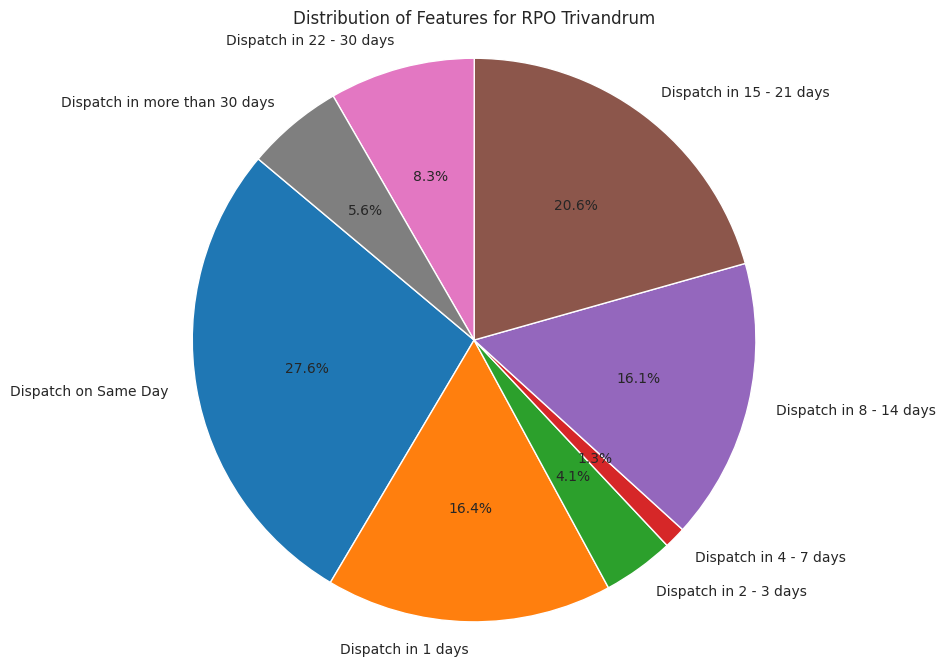

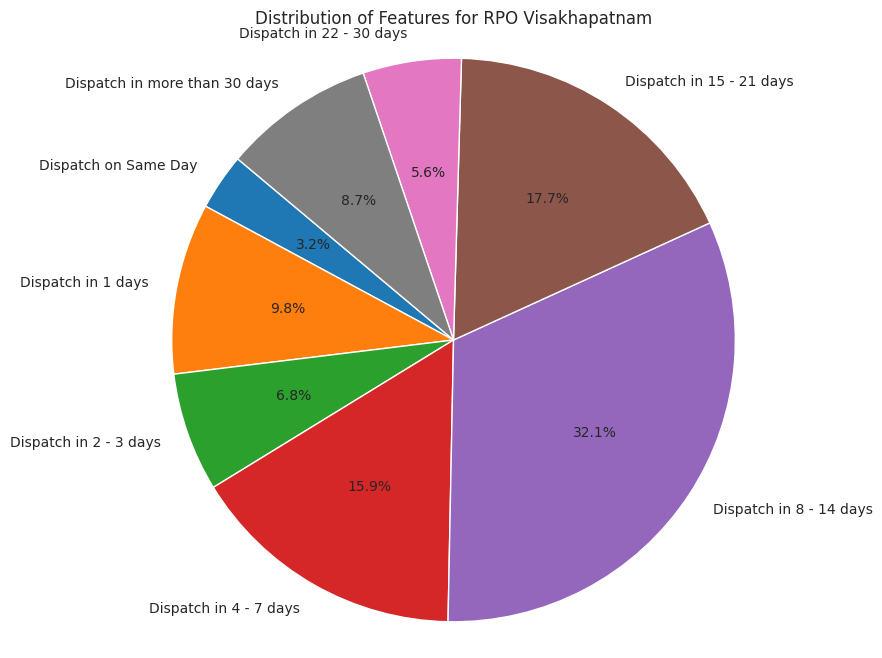

In [ ]:
features = df.columns[1:-1]

# Iterate over each row (RPO Name) in the DataFrame and plot a pie chart for each
for index, row in df.iterrows():
    rpo_name = row['RPO Name']
    plt.figure(figsize=(8, 8))  # Adjust figure size if needed
    rpo_data = row[features].values
    plt.pie(rpo_data, labels=features, autopct='%1.1f%%', startangle=140)
    plt.title(f'Distribution of Features for {rpo_name}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
    plt.show()

In [ ]:
sum_last_three = df.iloc[:, -4:-1].sum(axis=1)

# Calculate the percentage of this sum compared to the total value
total_value = df.iloc[:, -1]
percentage = sum_last_three / total_value * 100

# Filter rows where the percentage is greater than 50%
selected_rows = df[percentage > 80]

print(selected_rows)


         RPO Name  Dispatch on Same Day  Dispatch in 1 days  \
4    RPO Bareilly                    43                1843   
13  RPO Ghaziabad                   992                6352   
19      RPO Jammu                   338                  97   
20    RPO Kolkata                   174                2140   
22    RPO Lucknow                    69                1016   
27      RPO Patna                   141                3422   
31     RPO Shimla                   888                1099   
32   RPO Srinagar                  3319                 923   

    Dispatch in 2 - 3 days  Dispatch in 4 - 7 days  Dispatch in 8 - 14 days  \
4                      939                    2822                     8665   
13                    2757                    9389                    16277   
19                      39                      26                       98   
20                   23983                   47594                    34854   
22                   22139           

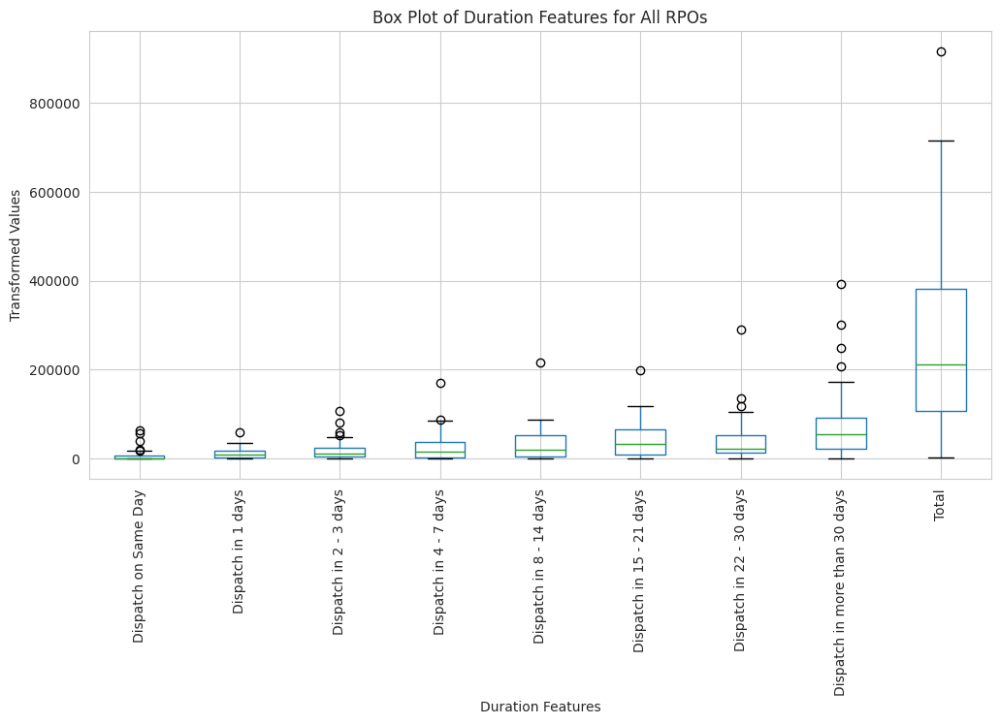

In [ ]:
plt.figure(figsize=(12, 6))
df.boxplot(rot=90)
plt.title('Box Plot of Duration Features for All RPOs')
plt.xlabel('Duration Features')
plt.ylabel('Transformed Values')
plt.show()

In [ ]:
sum_first_three = df.iloc[:, 1:4].sum(axis=1)

# Calculate the percentage of this sum compared to the total value
total_value = df.iloc[:, -1]
percentage = sum_first_three / total_value * 100

# Filter rows where the percentage is greater than 30%
selected_rows = df[percentage > 30]

print(selected_rows)

          RPO Name  Dispatch on Same Day  Dispatch in 1 days  \
8      RPO Chennai                 14405               58841   
14         RPO Goa                    99                8416   
36  RPO Trivandrum                 57775               34396   

    Dispatch in 2 - 3 days  Dispatch in 4 - 7 days  Dispatch in 8 - 14 days  \
8                    53040                   30203                    64939   
14                    5735                    2158                    16980   
36                    8571                    2623                    33762   

    Dispatch in 15 - 21 days  Dispatch in 22 - 30 days  \
8                      79564                     48444   
14                      9050                       797   
36                     43149                     17472   

    Dispatch in more than 30 days   Total  
8                           54765  404201  
14                           2068   45303  
36                          11625  209373  


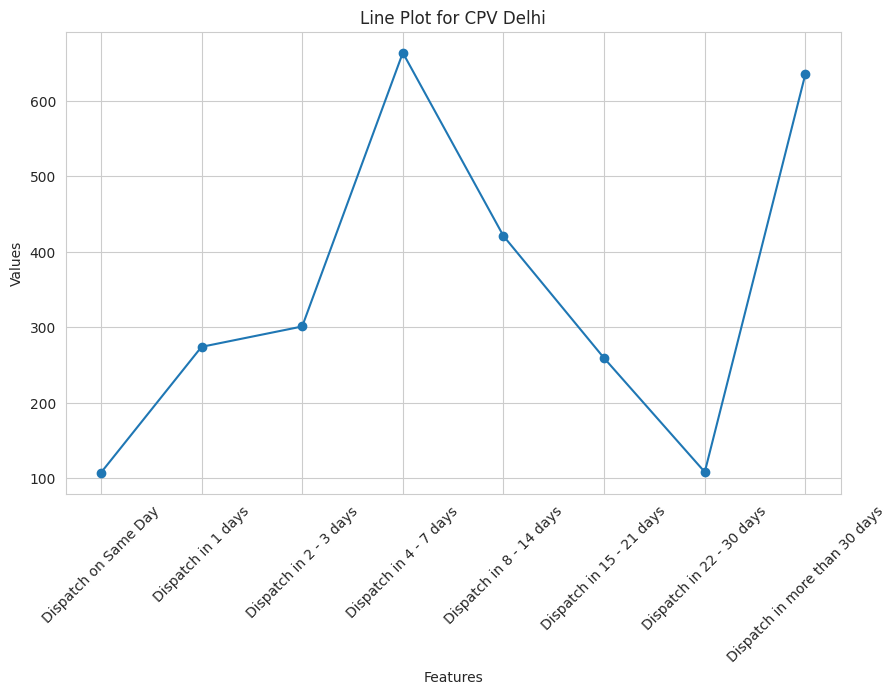

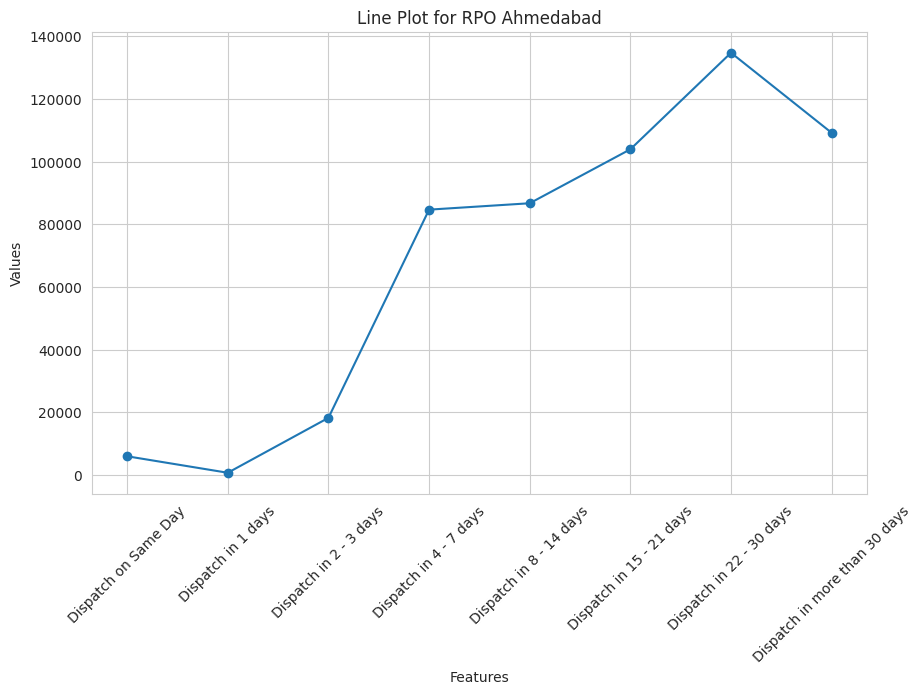

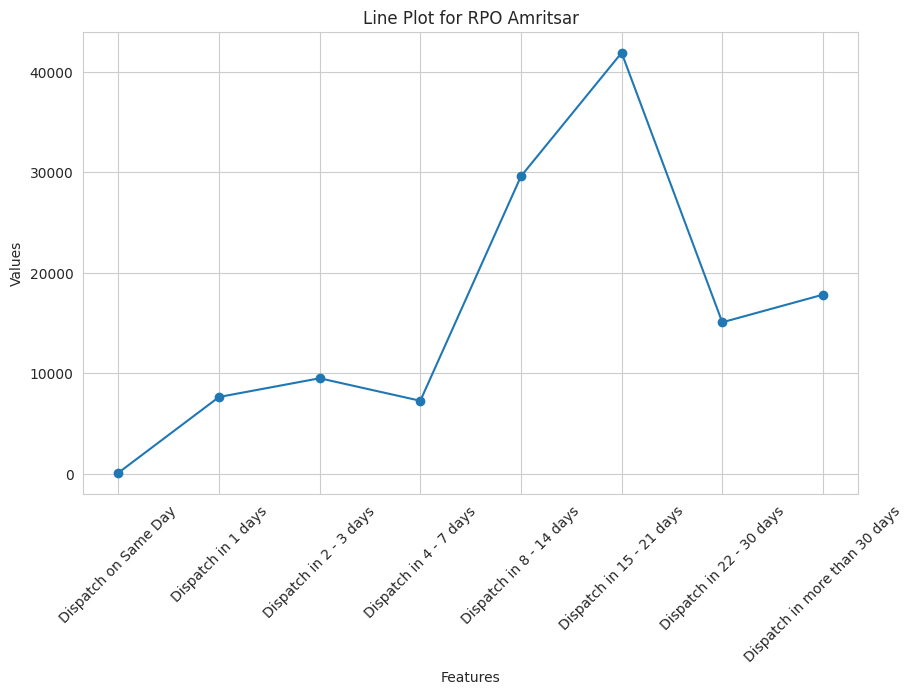

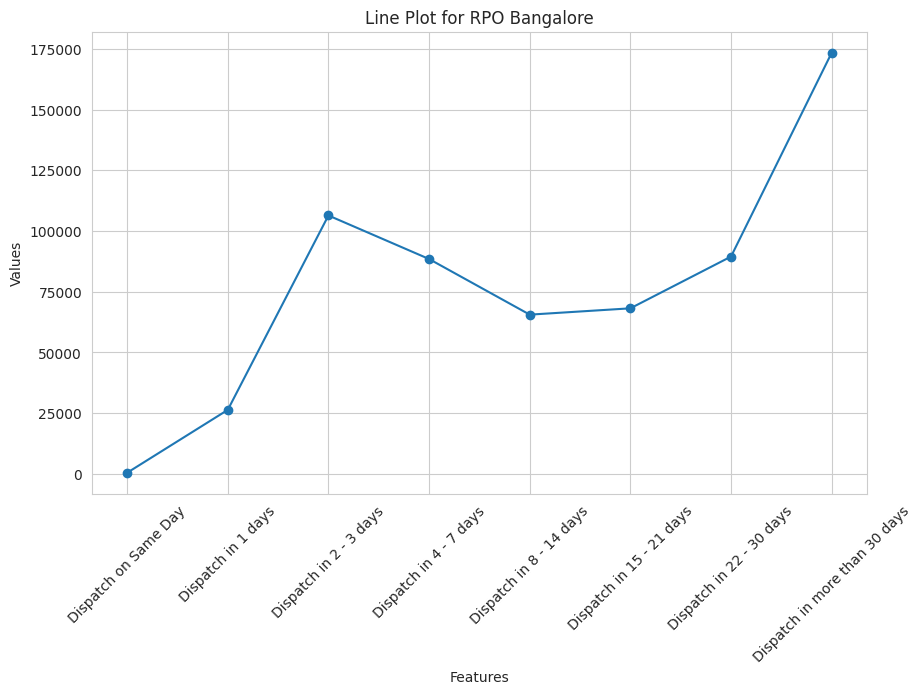

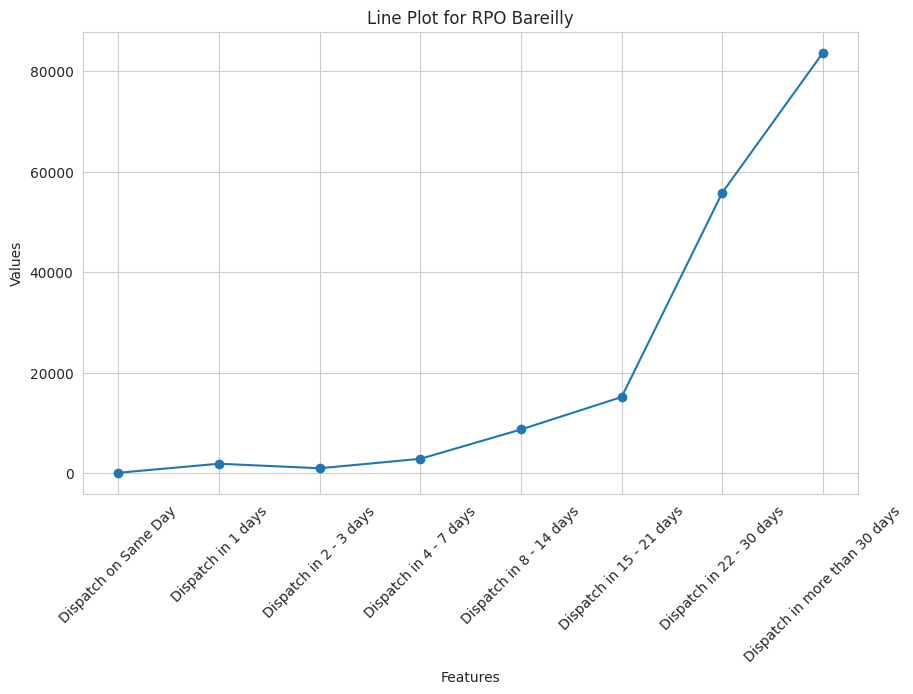

...

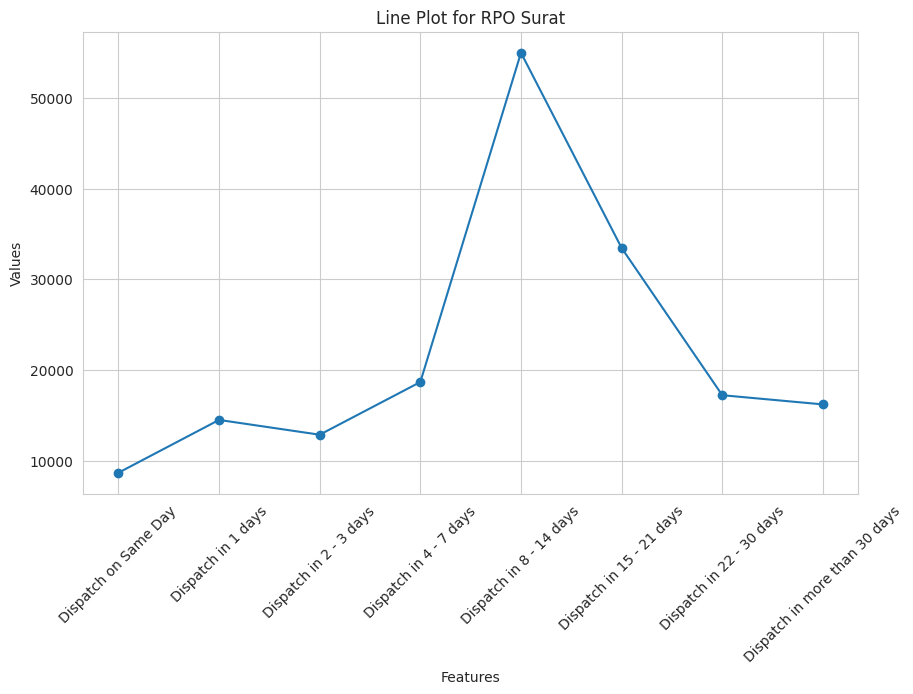

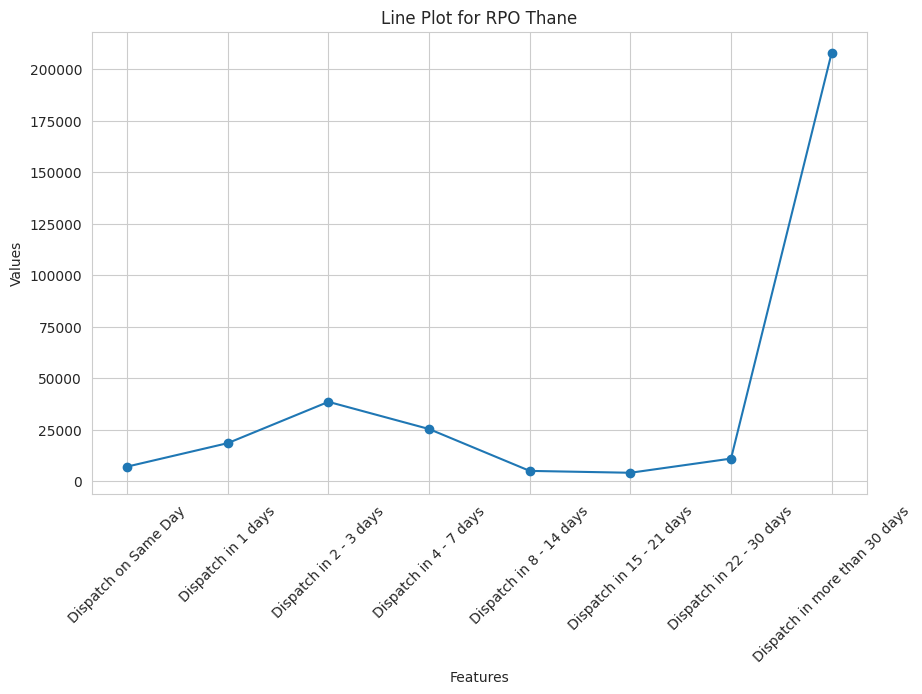

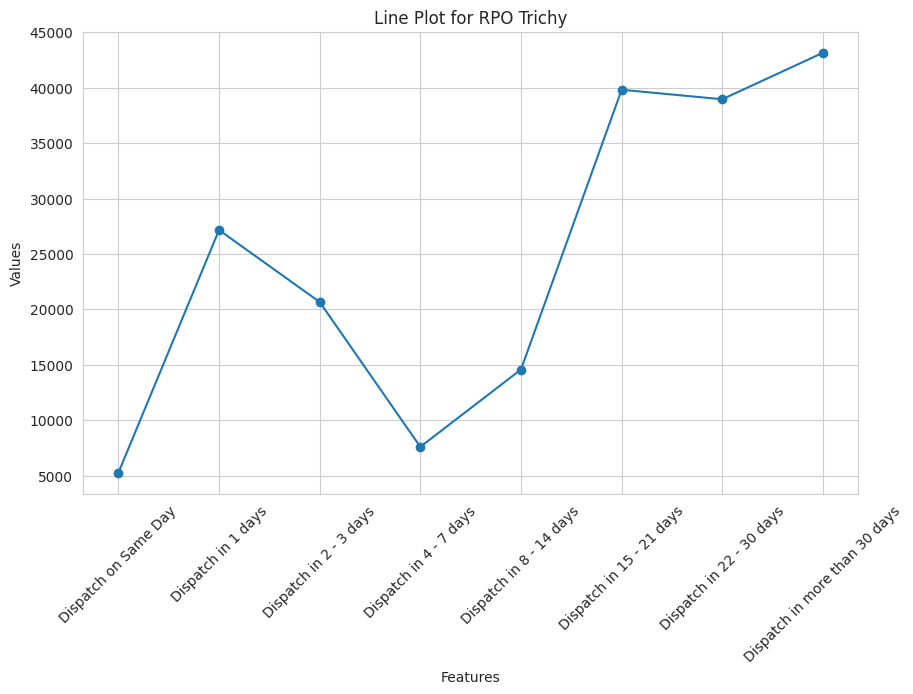

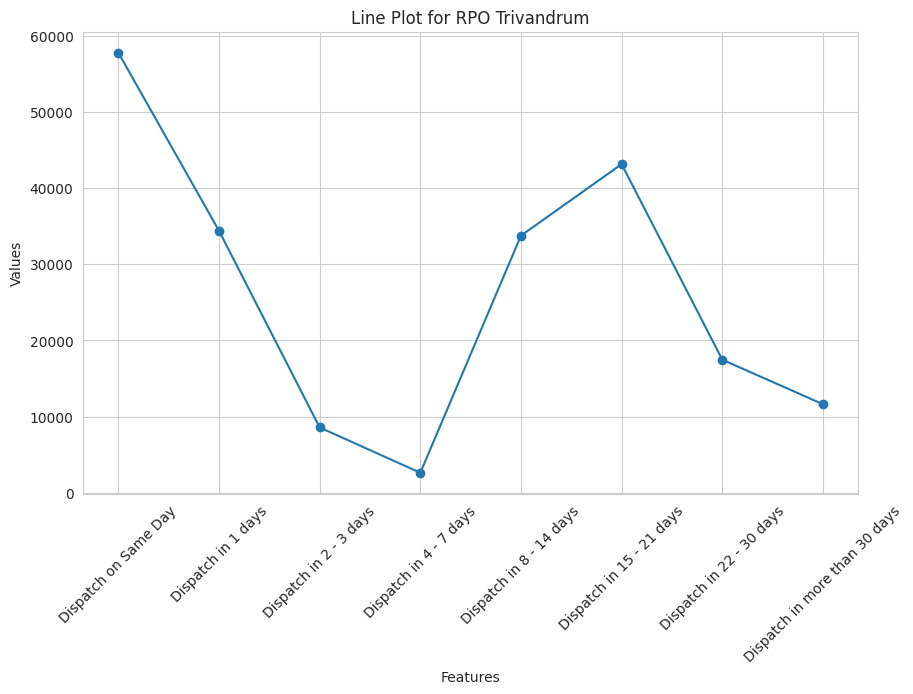

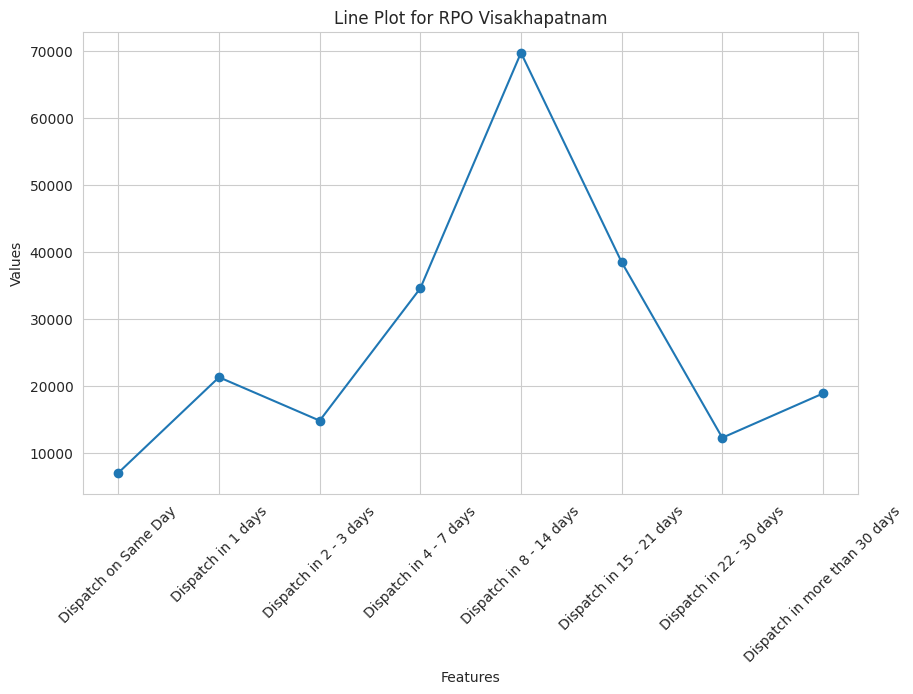

In [ ]:
features = df.columns[1:-1]

# Iterate over each RPO Name
for rpo_name, row in df.iterrows():
    # Extract the data for the current RPO Name, excluding the first and last columns
    rpo_data = row[features]
    rpo_namee=row['RPO Name']
    # Create a line plot for the current RPO Name
    plt.figure(figsize=(10, 6))
    plt.plot(features, rpo_data, marker='o', linestyle='-')
    plt.title(f'Line Plot for {rpo_namee}')
    plt.xlabel('Features')
    plt.ylabel('Values')
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.grid(True)
    plt.show()

In [ ]:
sum_first_three = df.iloc[:, 1:4].sum(axis=1)

# Calculate the percentage of this sum compared to the total value
total_value = df.iloc[:, -1]
percentage = (sum_first_three / total_value) * 100

# Add the percentage column to the DataFrame
df['Percentage'] = percentage

# Print the top 10 rows with the highest percentage along with RPO Name
top_10_rows = df.nlargest(10, 'Percentage')[['RPO Name', 'Percentage']]
print(top_10_rows)

          RPO Name  Percentage
36  RPO Trivandrum   48.116042
14         RPO Goa   31.454871
8      RPO Chennai   31.243367
24  RPO Malappuram   29.445306
21   RPO Kozhikode   27.757295
35      RPO Trichy   26.924696
10  RPO Coimbatore   25.530159
0        CPV Delhi   24.620939
25      RPO Mumbai   23.878518
18   RPO Jalandhar   23.398283


In [ ]:
sum_last_three = df.iloc[:, -4:-1].sum(axis=1)

# Calculate the percentage of this sum compared to the total value
total_value = df.iloc[:, -1]
percentage = sum_last_three / total_value * 100

df['Percentage']=percentage

last_10_rows=df.nlargest(10, 'Percentage')[['RPO Name', 'Percentage']]
print(last_10_rows)

          RPO Name    Percentage
22     RPO Lucknow  5.944779e+07
20     RPO Kolkata  2.354090e+07
4     RPO Bareilly  1.845943e+07
1    RPO Ahmedabad  1.716852e+07
27       RPO Patna  1.418270e+07
7   RPO Chandigarh  9.226360e+06
13   RPO Ghaziabad  7.832975e+06
17      RPO Jaipur  7.027226e+06
16   RPO Hyderabad  6.206558e+06
19       RPO Jammu  6.135219e+06


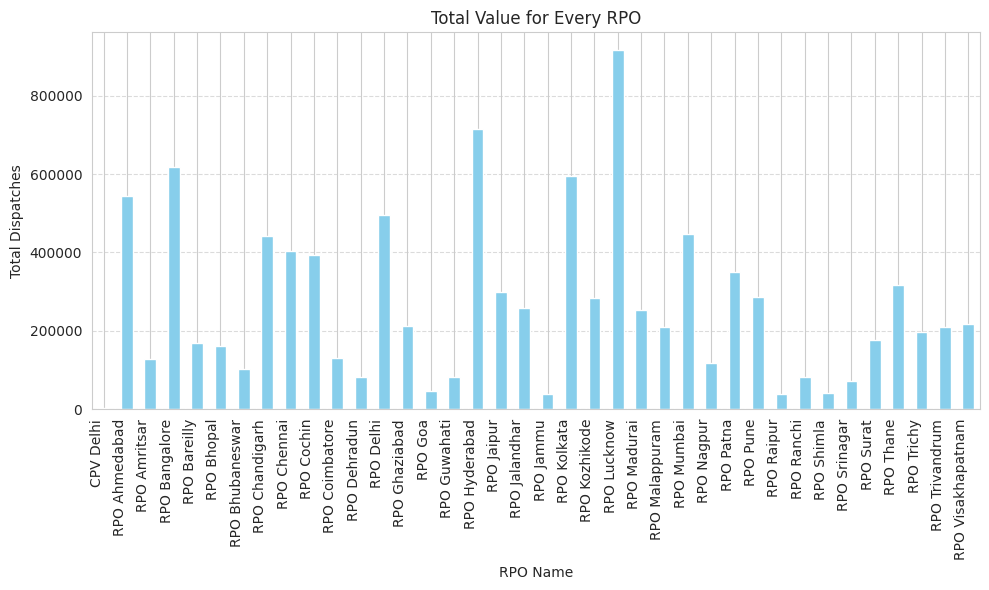

In [ ]:
df.set_index('RPO Name', inplace=True)

# Create a bar chart
plt.figure(figsize=(10, 6))
df['Total'].plot(kind='bar', color='skyblue')
plt.title('Total Value for Every RPO')
plt.xlabel('RPO Name')
plt.ylabel('Total Dispatches')
plt.xticks(rotation=90, ha='right')  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
sorted_df = df.sort_values(by='Total', ascending=False)

# Select the top 10 RPOs with the highest total value
top_10_rpos = sorted_df.head(10)

# Print only the 'RPO Name' and 'Total' columns for the top 10 RPOs
print(top_10_rpos[['Total']])

                 Total
RPO Name              
RPO Lucknow     915737
RPO Hyderabad   715228
RPO Bangalore   618415
RPO Kolkata     596090
RPO Ahmedabad   544213
RPO Delhi       496421
RPO Mumbai      447243
RPO Chandigarh  442494
RPO Chennai     404201
RPO Cochin      392547


In [ ]:
sorted_df = df.sort_values(by='Total')

# Select the least 10 RPOs with the lowest total value
least_10_rpos = sorted_df.head(10)

# Print only the 'RPO Name' and 'Total' columns for the least 10 RPOs
print(least_10_rpos[['Total']])

                  Total
RPO Name               
CPV Delhi          2770
RPO Jammu         38334
RPO Raipur        38428
RPO Shimla        40757
RPO Goa           45303
RPO Srinagar      72358
RPO Dehradun      81555
RPO Ranchi        81594
RPO Guwahati      82258
RPO Bhubaneswar  103308


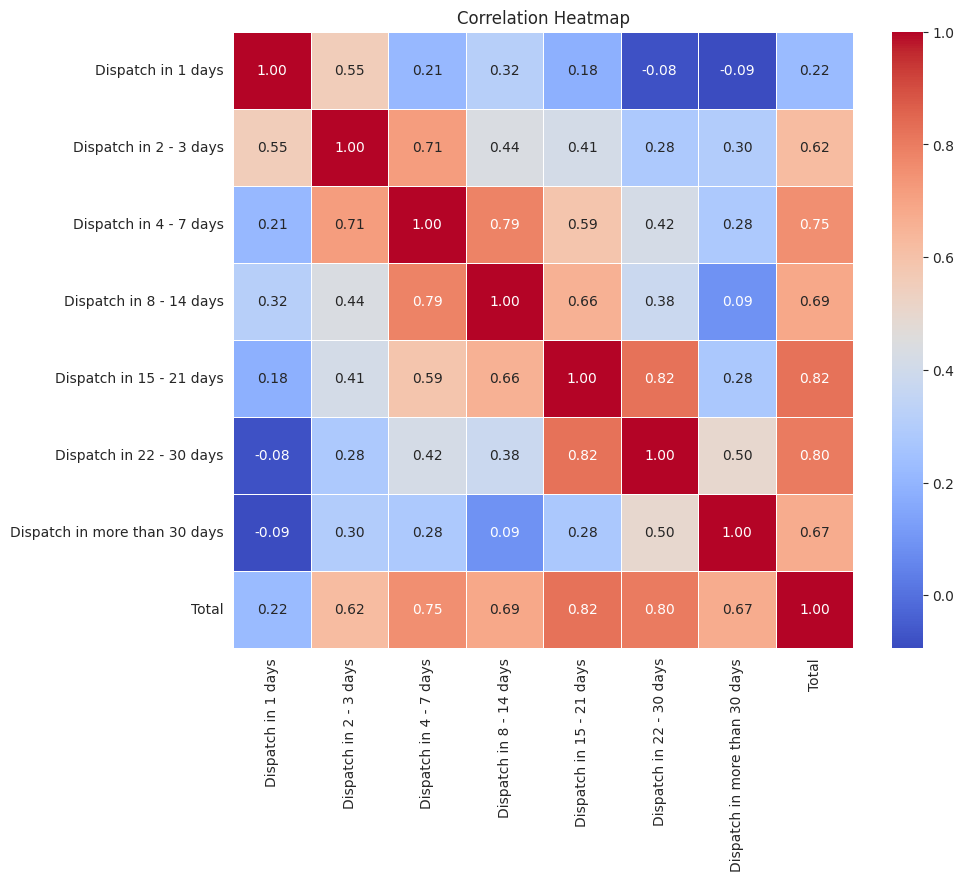

In [ ]:
df_subset = df.iloc[:, 1:-1]

# Calculate the correlation matrix
correlation_matrix = df_subset.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
df_subset = df.iloc[:, 1:-1]

# Standardize the data
scaler = StandardScaler()
df_standardized = pd.DataFrame(scaler.fit_transform(df_subset), columns=df_subset.columns)

df_standardized.head()

,Dispatch in 1 days,Dispatch in 2 - 3 days,Dispatch in 4 - 7 days,Dispatch in 8 - 14 days,Dispatch in 15 - 21 days,Dispatch in 22 - 30 days,Dispatch in more than 30 days,Total
0,-0.926406,-0.827026,-0.781708,-0.825306,-0.981347,-0.821633,-0.936105,-1.270052
1,-0.887753,-0.067124,1.659983,1.316265,1.401092,1.702476,0.351064,1.335983
2,-0.308711,-0.438122,-0.590356,-0.101696,-0.025260,-0.541372,-0.732542,-0.663699
3,1.264644,3.665375,1.770859,0.791711,0.579507,0.854457,1.113186,1.693127
4,-0.794565,-0.800018,-0.718990,-0.620715,-0.639564,0.223396,0.049111,-0.469951


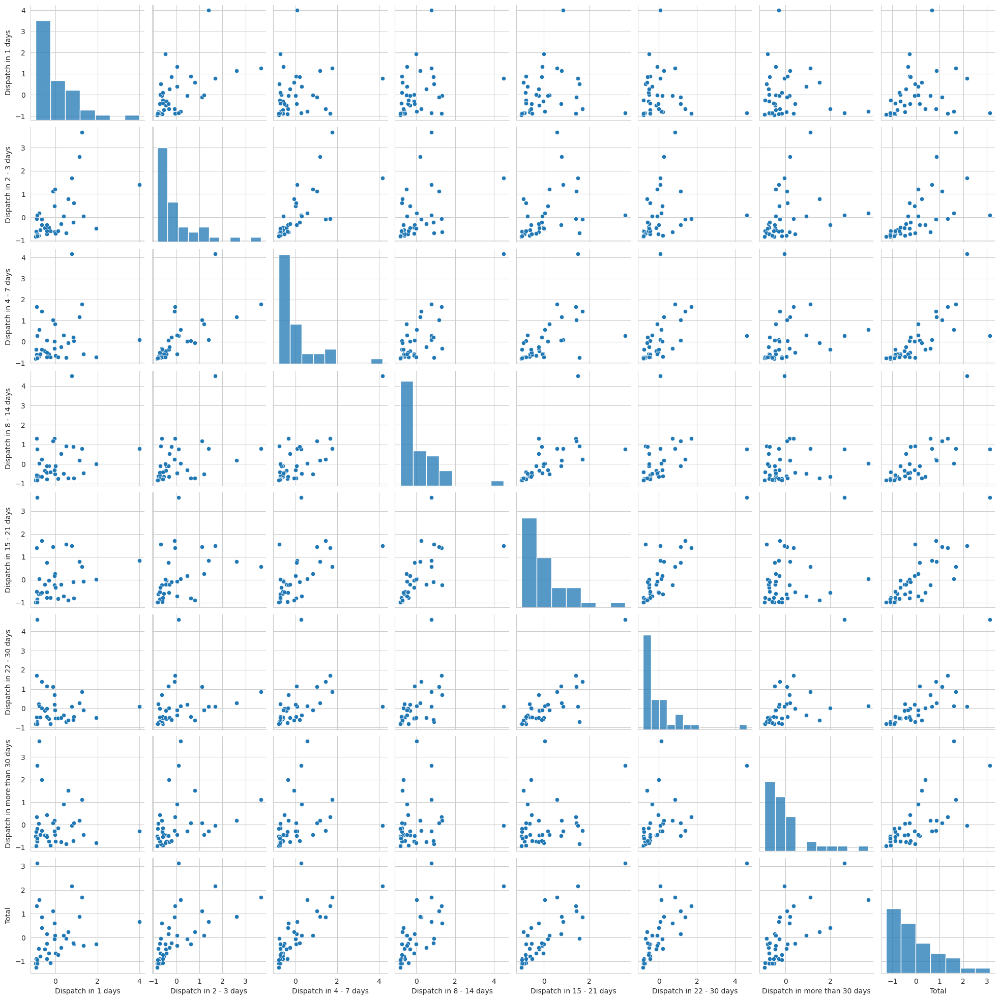

In [ ]:
sns.pairplot(df_standardized)
plt.show()

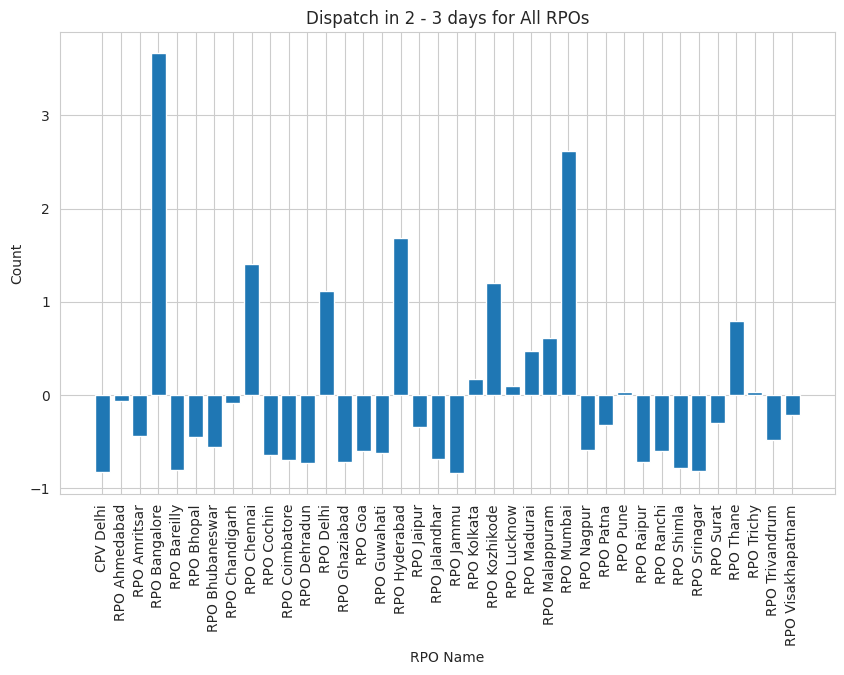

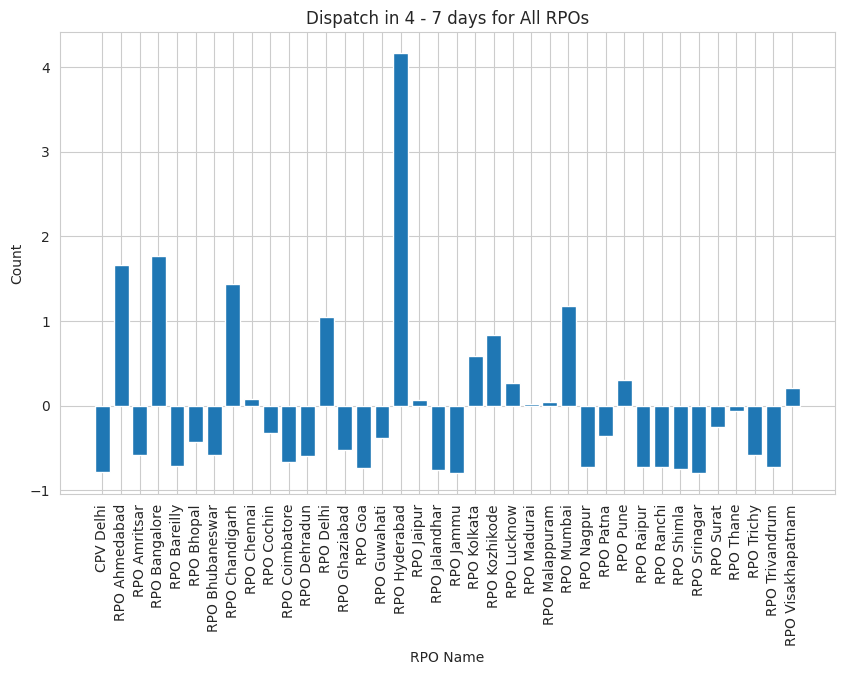

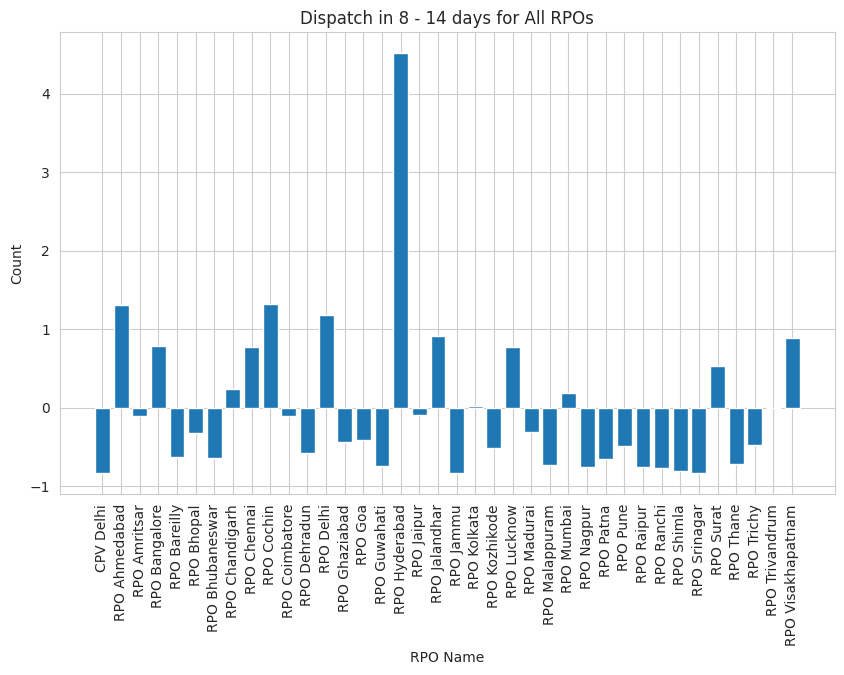

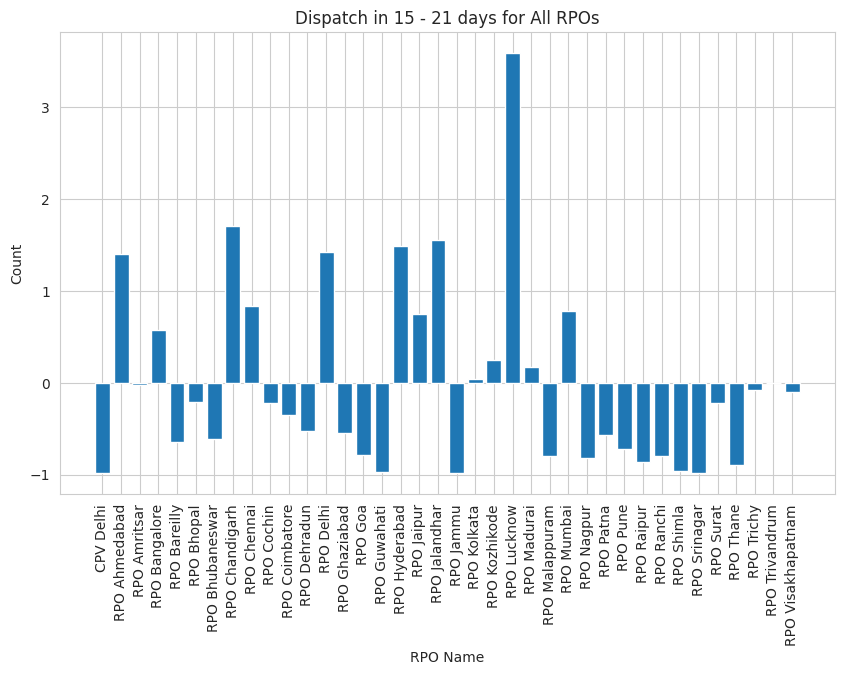

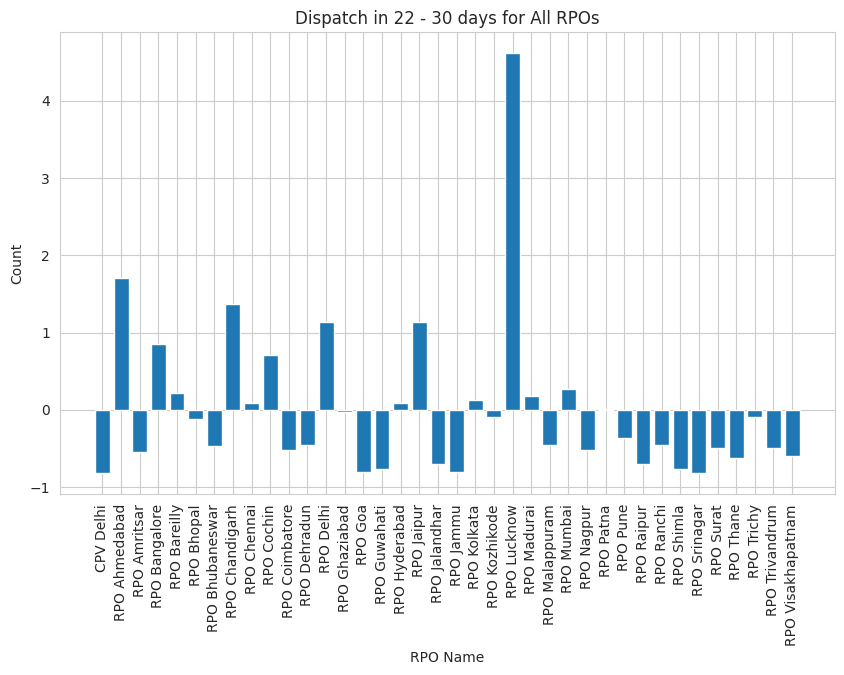

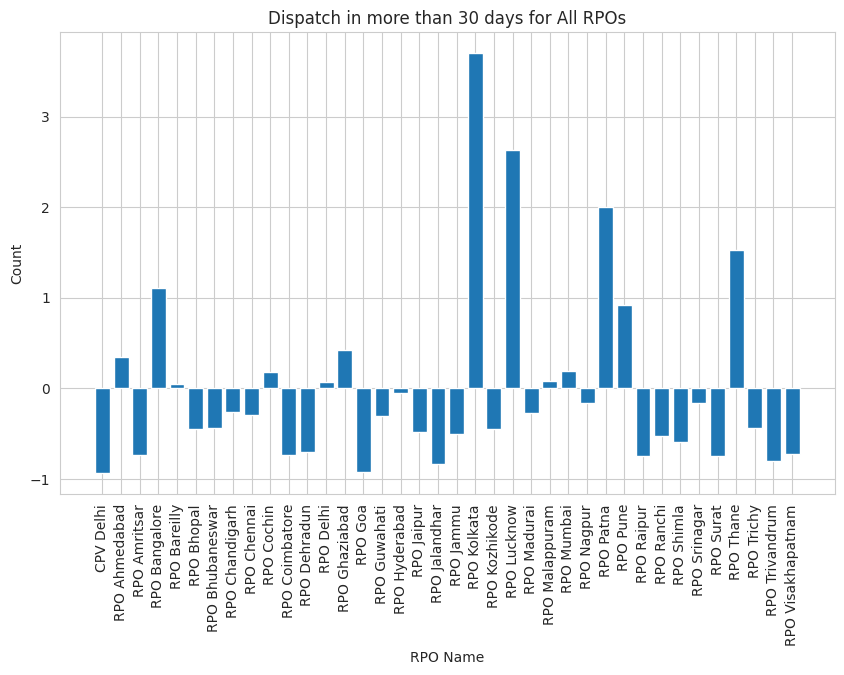

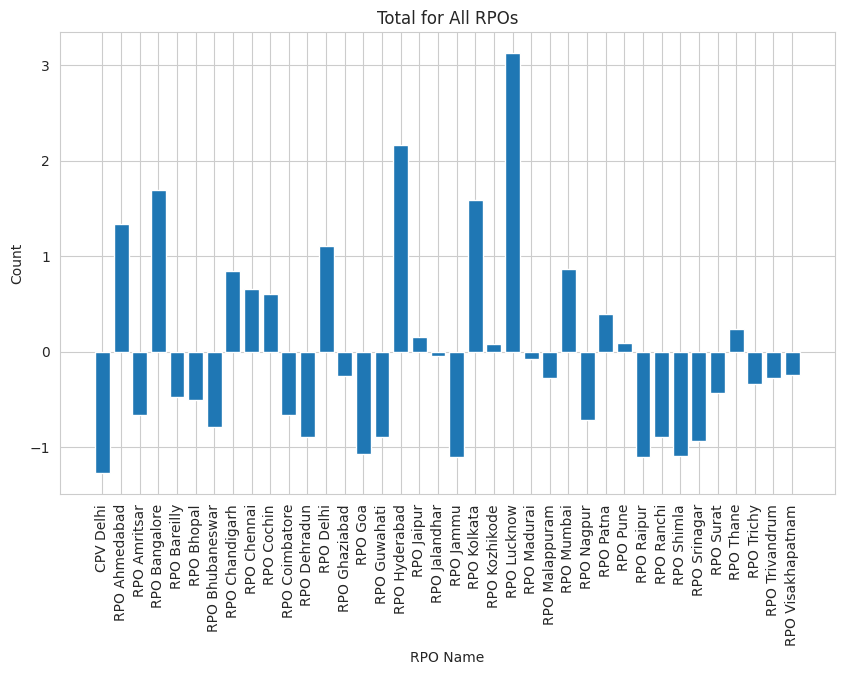

In [ ]:
dispatch_durations_st = df_standardized.columns[1:]  # Exclude the first column 'RPO Name'

# Plot bar plot for each dispatch duration for all RPOs
for duration in dispatch_durations_st:
    plt.figure(figsize=(10, 6))  # Adjust figure size if needed
    plt.bar(df.index, df_standardized[duration])
    plt.title(f'{duration} for All RPOs')
    plt.xlabel('RPO Name')
    plt.ylabel('Count')
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.show()

In [ ]:
df_duration = df.iloc[:, 1:-1]

# Feature Engineering
# Calculate the average duration across all duration features (excluding the first and last)
df['Average_Duration'] = df_duration.mean(axis=1)

# Compute the range (maximum - minimum) of durations across all duration features (excluding the first)
df['Duration_Range'] = df_duration.max(axis=1) - df_duration.min(axis=1)

# Standardize each duration feature (excluding the first and last) using z-score normalization
scaler = StandardScaler()
df_duration_standardized = pd.DataFrame(scaler.fit_transform(df_duration), columns=df_duration.columns)

# Calculate the ratio of the 'Total' to each duration feature (excluding the first)
for col in df_duration_standardized.columns:
    df[f'Total_to_{col}_Ratio'] = df['Total'] / df[col]

# Compute the difference between consecutive duration features (excluding the first)
for i in range(1, len(df_duration.columns)):
    df[f'Duration_Difference_{i}'] = df_duration.iloc[:, i] - df_duration.iloc[:, i-1]

# Print the modified DataFrame with engineered features
print(df)

                   Dispatch on Same Day  Dispatch in 1 days  \
RPO Name                                                      
CPV Delhi                           107                 274   
RPO Ahmedabad                      5996                 734   
RPO Amritsar                         88                7625   
RPO Bangalore                       444               26349   
RPO Bareilly                         43                1843   
RPO Bhopal                         2311                5363   
RPO Bhubaneswar                     436                2839   
RPO Chandigarh                     8285                3481   
RPO Chennai                       14405               58841   
RPO Cochin                        63828               10822   
RPO Coimbatore                    18233               11373   
RPO Dehradun                        376                 771   
RPO Delhi                           786               10017   
RPO Ghaziabad                       992                

In [ ]:
df_duration = df.iloc[:, 1:-1]

# Log Transformation
df_duration_log = df_duration.apply(lambda x: np.log1p(x))

# Standardization
scaler = StandardScaler()
df_duration_standardized = pd.DataFrame(scaler.fit_transform(df_duration_log), columns=df_duration_log.columns)

# Print the transformed DataFrame
print(df_duration_standardized)

    Dispatch in 1 days  Dispatch in 2 - 3 days  Dispatch in 4 - 7 days  \
0            -2.003703               -2.076305               -1.537966   
1            -1.339969                0.472070                1.185019   
2             0.239498                0.065615               -0.195901   
3             1.076614                1.567497                1.209777   
4            -0.718955               -1.370844               -0.725722   
5             0.001946                0.038993                0.116910   
6            -0.427383               -0.146363               -0.188969   
7            -0.289786                0.458859                1.131845   
8             1.619017                1.134836                0.605861   
9             0.475873               -0.361449                0.258367   
10            0.509399               -0.555832               -0.427973   
11           -1.306810               -0.706607               -0.228036   
12            0.423691                

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [ ]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')
df_duration_standardized_imputed = pd.DataFrame(imputer.fit_transform(df_duration_standardized), columns=df_duration_standardized.columns)

# Print the DataFrame after handling missing values
print(df_duration_standardized_imputed)

    Dispatch in 1 days  Dispatch in 2 - 3 days  Dispatch in 4 - 7 days  \
0            -2.003703               -2.076305               -1.537966   
1            -1.339969                0.472070                1.185019   
2             0.239498                0.065615               -0.195901   
3             1.076614                1.567497                1.209777   
4            -0.718955               -1.370844               -0.725722   
5             0.001946                0.038993                0.116910   
6            -0.427383               -0.146363               -0.188969   
7            -0.289786                0.458859                1.131845   
8             1.619017                1.134836                0.605861   
9             0.475873               -0.361449                0.258367   
10            0.509399               -0.555832               -0.427973   
11           -1.306810               -0.706607               -0.228036   
12            0.423691                

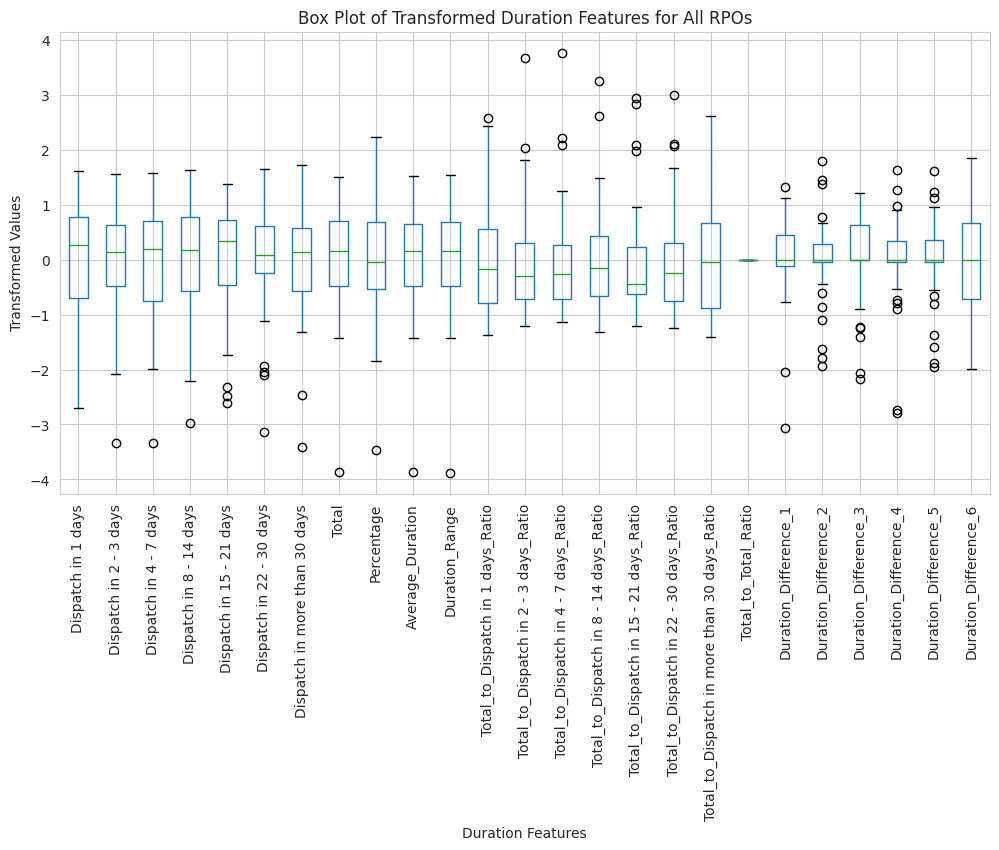

In [ ]:
plt.figure(figsize=(12, 6))
df_duration_standardized_imputed.boxplot(rot=90)
plt.title('Box Plot of Transformed Duration Features for All RPOs')
plt.xlabel('Duration Features')
plt.ylabel('Transformed Values')
plt.show()

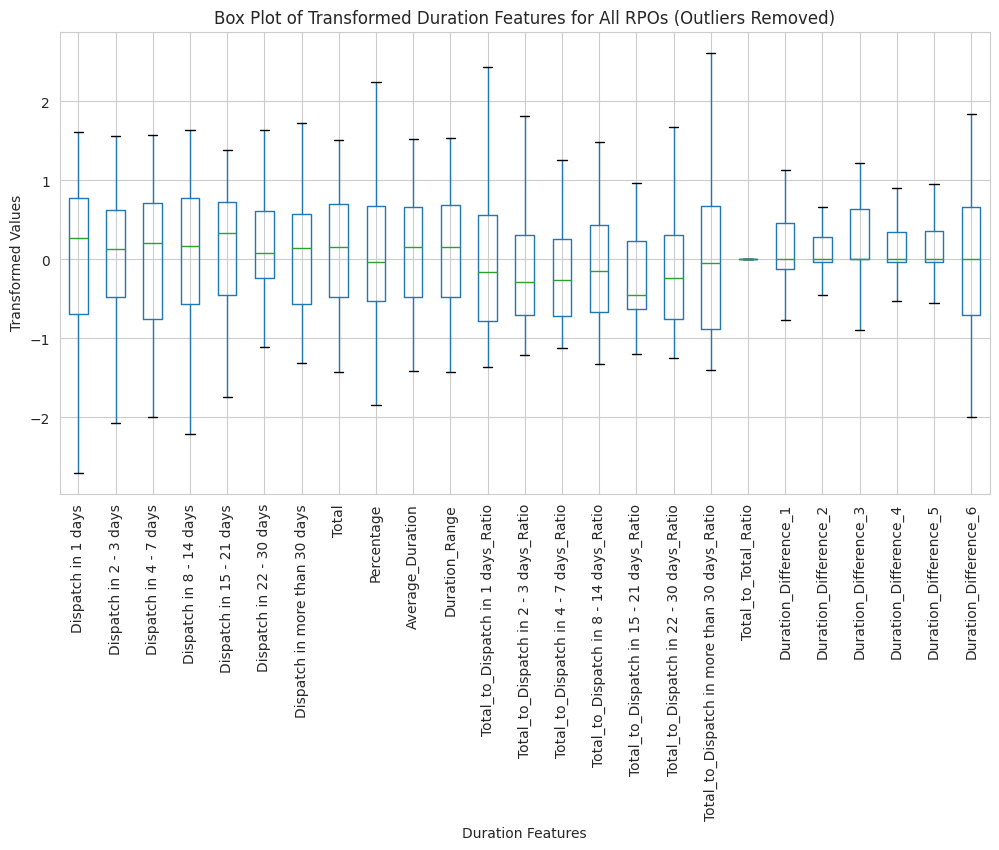

In [ ]:
plt.figure(figsize=(12, 6))
df_duration_standardized_imputed.boxplot(rot=90, showfliers=False)
plt.title('Box Plot of Transformed Duration Features for All RPOs (Outliers Removed)')
plt.xlabel('Duration Features')
plt.ylabel('Transformed Values')
plt.show()

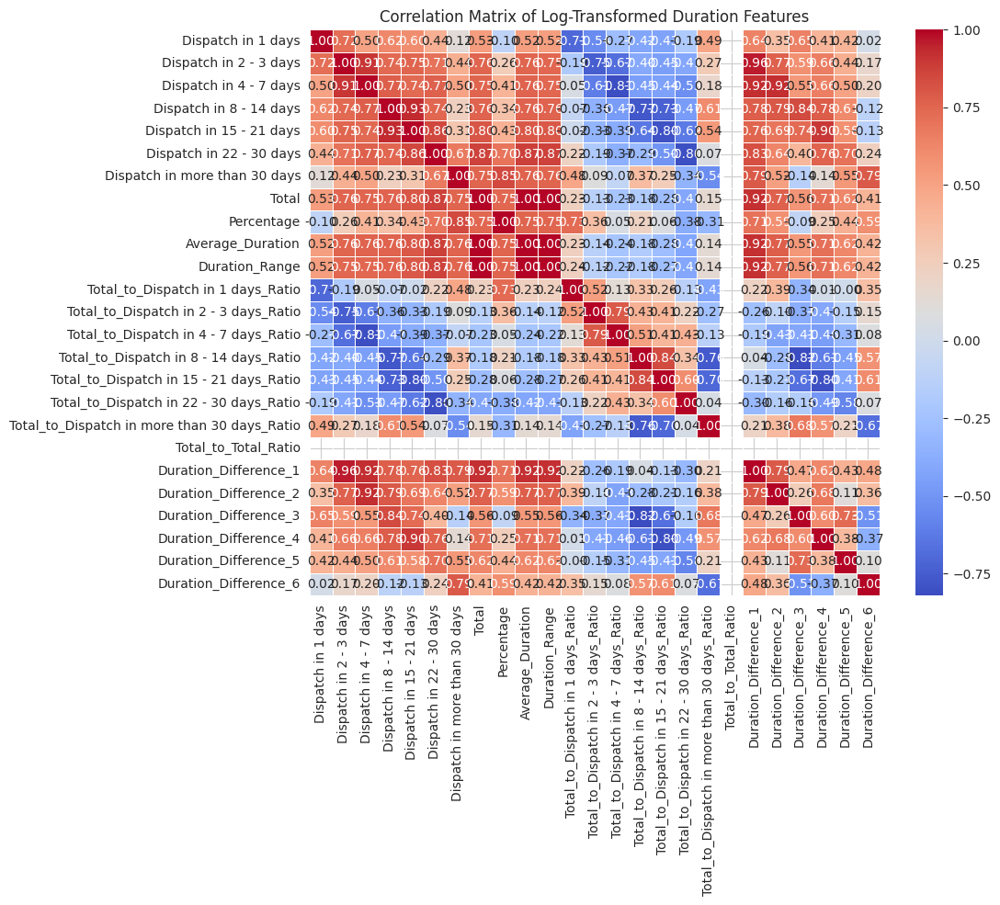

                   Dispatch in 1 days  Dispatch in 2 - 3 days  \
RPO Name                                                        
CPV Delhi                    5.616771                5.710427   
RPO Ahmedabad                6.599870                9.812085   
RPO Amritsar                 8.939319                9.157889   
RPO Bangalore               10.179224               11.575196   
RPO Bareilly                 7.519692                6.845880   
RPO Bhopal                   8.587465                9.115040   
RPO Bhubaneswar              7.951559                8.816705   
RPO Chandigarh               8.155362                9.790823   
RPO Chennai                 10.982611               10.878820   
RPO Cochin                   9.289429                8.470521   
RPO Coimbatore               9.339085                8.157657   
RPO Dehradun                 6.648985                7.914983   
RPO Delhi                    9.212139               10.738373   
RPO Ghaziabad            

<ipython-input-72-02a58601c5bc>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_duration_log[new_feature_name] = df_duration_log[col1] * df_duration_log[col2]
<ipython-input-72-02a58601c5bc>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_duration_log[new_feature_name] = df_duration_log[col1] * df_duration_log[col2]
<ipython-input-72-02a58601c5bc>:17: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all co

In [ ]:
correlation_matrix = df_duration_log.corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Log-Transformed Duration Features')
plt.show()

# Identify important correlations and create new features based on them
# For example, let's create a new feature that represents the interaction between two highly correlated features
# Here, we'll multiply two features with a correlation coefficient greater than a certain threshold (e.g., 0.7)
threshold = 0.7
for col1 in correlation_matrix.columns:
    for col2 in correlation_matrix.columns:
        if col1 != col2 and correlation_matrix.loc[col1, col2] > threshold:
            new_feature_name = f'{col1}_x_{col2}'  # New feature name
            df_duration_log[new_feature_name] = df_duration_log[col1] * df_duration_log[col2]

# Print the DataFrame with new features
print(df_duration_log)

In [ ]:
imputer = SimpleImputer(strategy='mean')

# Fit and transform the DataFrame to impute NaN values in the new features
df_duration_log_imputed = pd.DataFrame(imputer.fit_transform(df_duration_log), columns=df_duration_log.columns)

# Print the DataFrame with imputed NaN values
print(df_duration_log_imputed)

    Dispatch in 1 days  Dispatch in 2 - 3 days  Dispatch in 4 - 7 days  \
0             5.616771                5.710427                6.499787   
1             6.599870                9.812085               11.346611   
2             8.939319                9.157889                8.888619   
3            10.179224               11.575196               11.390679   
4             7.519692                6.845880                7.945555   
5             8.587465                9.115040                9.445412   
6             7.951559                8.816705                8.900958   
7             8.155362                9.790823               11.251963   
8            10.982611               10.878820               10.315730   
9             9.289429                8.470521                9.697201   
10            9.339085                8.157657                8.475538   
11            6.648985                7.914983                8.831420   
12            9.212139               1

In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression

cthreshold = 0.5
selected_features = correlation_matrix.abs().stack().reset_index().rename(columns={0:'correlation'})
selected_features = selected_features[(selected_features['level_0'] != selected_features['level_1']) & (selected_features['correlation'] > threshold)]
selected_features = selected_features.drop_duplicates(subset=['correlation']).sort_values(by='correlation', ascending=False)
print("Selected Features based on correlation threshold:")
print(selected_features)

# Alternatively, you can use advanced feature selection techniques like SelectKBest
# For example, let's use SelectKBest with f_regression scoring to select the top k features
k = 5  # Number of top features to select
selector = SelectKBest(score_func=f_regression, k=k)
X = df_duration_log_imputed.drop(columns=['Total'])  # Assuming 'target' is the target variable
y = df_duration_log_imputed['Total']
selector.fit(X, y)
selected_features_indices = selector.get_support(indices=True)
selected_features_names = X.columns[selected_features_indices]
print("Top {} selected features using SelectKBest:".format(k))
print(selected_features_names)

Selected Features based on correlation threshold:
                      level_0                            level_1  correlation
178                     Total                     Duration_Range     0.999823
177                     Total                   Average_Duration     0.999611
226          Average_Duration                     Duration_Range     0.999383
42     Dispatch in 2 - 3 days              Duration_Difference_1     0.960741
76    Dispatch in 8 - 14 days           Dispatch in 15 - 21 days     0.931753
..                        ...                                ...          ...
237          Average_Duration              Duration_Difference_4     0.710743
210                Percentage              Duration_Difference_1     0.707162
29     Dispatch in 2 - 3 days           Dispatch in 22 - 30 days     0.706373
11         Dispatch in 1 days  Total_to_Dispatch in 1 days_Ratio     0.706302
142  Dispatch in 22 - 30 days              Duration_Difference_5     0.703392

[77 rows x 3 

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Assuming 'df_duration_log_imputed' contains the selected features and the target variable 'target'

# Split the data into training and testing sets
X = df_duration_log_imputed[selected_features_names]  # Use the selected features
y = df_duration_log_imputed['Total']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

Mean Squared Error: 0.000210231189779122


Train RMSE: 0.009846214161300196
Test RMSE: 0.014499351357185672


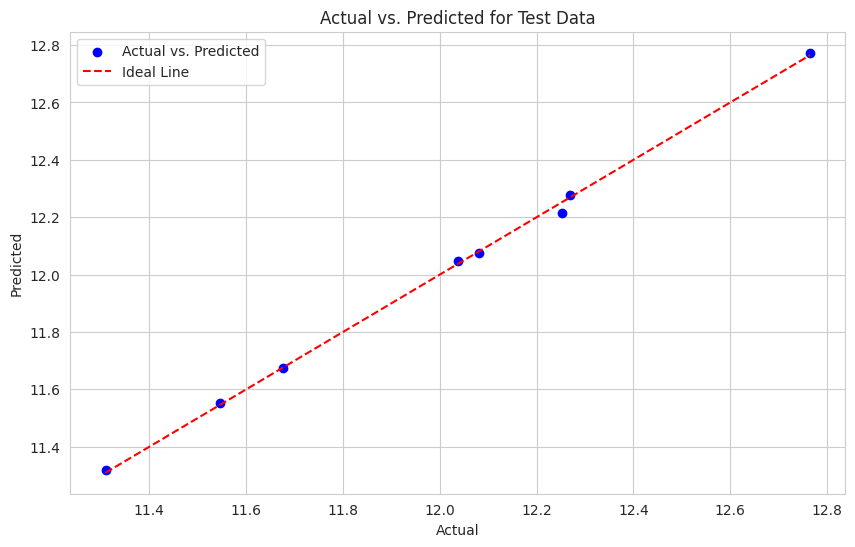

Slope of the actual vs. predicted line: 5.1014095182059975


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming 'df_duration_log_imputed' contains the selected features and the target variable 'target'

# Split the data into training and testing sets
X = df_duration_log_imputed[selected_features_names]  # Use the selected features
y = df_duration_log_imputed['Total']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the training set
y_train_pred = model.predict(X_train)
train_rmse = mean_squared_error(y_train, y_train_pred, squared=False)
print("Train RMSE:", train_rmse)

# Predict on the test set
y_test_pred = model.predict(X_test)
test_rmse = mean_squared_error(y_test, y_test_pred, squared=False)
print("Test RMSE:", test_rmse)

# Plot the predictions for the test data
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, color='blue', label='Actual vs. Predicted')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Line')
plt.title('Actual vs. Predicted for Test Data')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.legend()
plt.grid(True)
plt.show()

# Retrieve the slope (coefficient) from the linear regression model
slope = model.coef_[0]
print("Slope of the actual vs. predicted line:", slope)


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Discretize the target variable into categories
num_bins = 5  # Adjust the number of bins as needed
y_bins = pd.cut(y, bins=num_bins, labels=False)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_bins, test_size=0.2, random_state=42)

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the classifier
rf_classifier.fit(X_train, y_train)

# Predict the labels for test set
y_pred = rf_classifier.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 1.0
Classification Report:
              precision    recall  f1-score   support

           2       1.00      1.00      1.00         1
           3       1.00      1.00      1.00         6
           4       1.00      1.00      1.00         1

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

